# Load data and libraries

In [0]:
#@title
!pip install gpxpy
!pip install pyshp
import dask.dataframe as dd
import pandas as pd


import matplotlib
%matplotlib inline
import matplotlib.pyplot as pyplot
import matplotlib.pylab as plt
from matplotlib import rcParams#Size of plots  

import numpy as np
import folium
import gpxpy.geo
from datetime import datetime
import time
import seaborn as sns
import os
import math
import xgboost as xgb
import matplotlib
matplotlib.use('nbagg')
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.cluster import MiniBatchKMeans, KMeans, Birch, DBSCAN, OPTICS
from sklearn.neural_network import MLPClassifier
import warnings
warnings.simplefilter('ignore')
import sqlalchemy as db
from google.colab import drive
import zipfile
import shapefile
drive.mount('/content/drive', force_remount=True)

import pickle




import xgboost as xgb
import warnings
warnings.filterwarnings("ignore")

     |████████████████████████████████| 112kB 4.9MB/s 
  Created wheel for gpxpy: filename=gpxpy-1.3.5-cp36-none-any.whl size=40315 sha256=b6b3a1a2e5c2fa505da5c2f7222994b6cdf574e61a7864a84b0e8e1773f1b8c9
  Stored in directory: /root/.cache/pip/wheels/d2/f0/5e/b8e85979e66efec3eaa0e47fbc5274db99fd1a07befd1b2aa4
Successfully built gpxpy
     |████████████████████████████████| 225kB 4.8MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32607 sha256=0259555b1d17a04e0cc9d5e3561d98d024b5701e093b4d932ebf8d0c8da2cb79
  Stored in directory: /root/.cache/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built pyshp
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2faut

In [0]:
yellow_data_2017 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_tripdata_2017-01.csv')
green_data_2017 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/green_tripdata_2017-01.csv')
# fhv_data_2017 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/fhv_tripdata_2017-01.csv')

In [0]:
yellow_data_2017.equals(green_data_2017)

False

In [0]:
yellow_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_tripdata_2018-01.csv')
green_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/green_tripdata_2018-01.csv')
# fhv_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/fhv_tripdata_2018-01.csv')

In [0]:
green_data_2018.shape

(793529, 19)

In [0]:
yellow_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_tripdata_2018-02.csv')
green_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/green_tripdata_2018-02.csv')

In [0]:
yellow_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_tripdata_2018-03.csv')
green_data_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/green_tripdata_2018-03.csv')

In [0]:
fhv_data_2017.head()

,Dispatching_base_num,Pickup_DateTime,DropOff_datetime,PUlocationID,DOlocationID
0,B00001,2017-01-01 00:30:00,NaN,NaN,NaN
1,B00001,2017-01-01 00:30:00,NaN,NaN,NaN
2,B00008,2017-01-01 00:50:00,NaN,NaN,NaN
3,B00009,2017-01-01 00:10:00,NaN,NaN,NaN
4,B00009,2017-01-01 00:50:00,NaN,NaN,NaN


# Location Data

In [0]:
df_loc = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/loc_Data.csv')

In [0]:
df_loc.count()

X             263
Y             263
borough       263
location_i    263
objectid      263
shape_area    263
shape_leng    263
zone          263
dtype: int64

In [0]:
df_loc.groupby('zone').count()

,X,Y,borough,location_i,objectid,shape_area,shape_leng
zone,,,,,,,
Allerton/Pelham Gardens,1,1,1,1,1,1,1
Alphabet City,1,1,1,1,1,1,1
Arden Heights,1,1,1,1,1,1,1
Arrochar/Fort Wadsworth,1,1,1,1,1,1,1
Astoria,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...
Woodlawn/Wakefield,1,1,1,1,1,1,1
Woodside,1,1,1,1,1,1,1
World Trade Center,1,1,1,1,1,1,1


In [0]:
#@title
df_loc = df_loc.rename(columns={"X": "longitude", "Y": "latitude", "location_i":"LocationID"})
pickup_loc = df_loc.copy()
pickup_loc.columns = ['pickup_'+str(col) for col in pickup_loc.columns]
dropoff_loc = df_loc.copy()
dropoff_loc.columns = ['dropoff_'+str(col) for col in dropoff_loc.columns]


In [0]:
pickup_loc.columns

Index(['pickup_longitude', 'pickup_latitude', 'pickup_borough',
       'pickup_LocationID', 'pickup_objectid', 'pickup_shape_area',
       'pickup_shape_leng', 'pickup_zone'],
      dtype='object')

In [0]:
# #@title
temp_df = pd.merge(yellow_data_2017, pickup_loc, how='inner', on=None, left_on="PULocationID", right_on="pickup_LocationID",
         left_index=False, right_index=False)#@title
temp_df_green = pd.merge(green_data_2017, pickup_loc, how='inner', on=None, left_on="PULocationID", right_on="pickup_LocationID",
         left_index=False, right_index=False)
# temp_df = pd.merge(fhv_data_2017, pickup_loc, how='inner', on=None, left_on="PUlocationID", right_on="pickup_LocationID",
#          left_index=False, right_index=False)

In [0]:
temp_df

,Dispatching_base_num,Pickup_DateTime,DropOff_datetime,PUlocationID,DOlocationID,pickup_longitude,pickup_latitude,pickup_borough,pickup_LocationID,pickup_objectid,pickup_shape_area,pickup_shape_leng,pickup_zone
0,B00029,2017-01-01 00:56:00,NaN,174.0,NaN,-73.877757,40.876852,Bronx,174,174,0.000156,0.067818,Norwood
1,B02395,2017-01-01 00:44:10,NaN,174.0,NaN,-73.877757,40.876852,Bronx,174,174,0.000156,0.067818,Norwood
2,B02395,2017-01-01 00:38:39,NaN,174.0,NaN,-73.877757,40.876852,Bronx,174,174,0.000156,0.067818,Norwood
3,B02395,2017-01-01 00:38:36,NaN,174.0,NaN,-73.877757,40.876852,Bronx,174,174,0.000156,0.067818,Norwood
4,B02395,2017-01-01 00:16:08,NaN,174.0,NaN,-73.877757,40.876852,Bronx,174,174,0.000156,0.067818,Norwood
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9931946,B02764,2017-01-02 12:00:29,NaN,110.0,NaN,-74.125849,40.543265,Staten Island,110,110,0.000526,0.103946,Great Kills Park
9931947,B02882,2017-01-11 07:01:55,NaN,110.0,NaN,-74.125849,40.543265,Staten Island,110,110,0.000526,0.103946,Great Kills Park
9931948,B02836,2017-01-12 18:37:53,NaN,110.0,NaN,-74.125849,40.543265,Staten Island,110,110,0.000526,0.103946,Great Kills Park
9931949,B02764,2017-01-24 06:55:28,NaN,110.0,NaN,-74.125849,40.543265,Staten Island,110,110,0.000526,0.103946,Great Kills Park


In [0]:
# #@title
temp_df1 = pd.merge(yellow_data_2018, pickup_loc, how='inner', on=None, left_on="PULocationID", right_on="pickup_LocationID",
         left_index=False, right_index=False)#@title
temp_df2 = pd.merge(green_data_2018, pickup_loc, how='inner', on=None, left_on="PULocationID", right_on="pickup_LocationID",
         left_index=False, right_index=False)
# temp_df3 = pd.merge(fhv_data_2018, pickup_loc, how='inner', on=None, left_on="PUlocationID", right_on="pickup_LocationID",
#          left_index=False, right_index=False)

In [0]:
# #@title
final_df_yellow = pd.merge(temp_df, dropoff_loc, how='inner', on=None, left_on="DOLocationID", right_on="dropoff_LocationID",
         left_index=False, right_index=False)
# @title
final_df_green = pd.merge(temp_df_green, dropoff_loc, how='inner', on=None, left_on="DOLocationID", right_on="dropoff_LocationID",
         left_index=False, right_index=False)
# final_df_fhv = pd.merge(temp_df, dropoff_loc, how='inner', on=None, left_on="DOlocationID", right_on="dropoff_LocationID",
#          left_index=False, right_index=False)

In [0]:
final_df_fhv

,Dispatching_base_num,Pickup_DateTime,DropOff_datetime,PUlocationID,DOlocationID,pickup_longitude,pickup_latitude,pickup_borough,pickup_LocationID,pickup_objectid,pickup_shape_area,pickup_shape_leng,pickup_zone,dropoff_longitude,dropoff_latitude,dropoff_borough,dropoff_LocationID,dropoff_objectid,dropoff_shape_area,dropoff_shape_leng,dropoff_zone
0,B02243,2017-01-02 13:27:00,2017-01-02 13:28:00,195.0,37.0,-74.009553,40.675464,Brooklyn,195,195,0.000802,0.131308,Red Hook,-73.925941,40.696263,Brooklyn,37,37,0.000452,0.14281,Bushwick South


In [0]:
# #@title
final_df_yellow = pd.merge(temp_df1, dropoff_loc, how='inner', on=None, left_on="DOLocationID", right_on="dropoff_LocationID",
         left_index=False, right_index=False)
final_df_green = pd.merge(temp_df2, dropoff_loc, how='inner', on=None, left_on="DOLocationID", right_on="dropoff_LocationID",
         left_index=False, right_index=False)
# final_df_fhv = pd.merge(temp_df3, dropoff_loc, how='inner', on=None, left_on="DOlocationID", right_on="dropoff_LocationID",
#          left_index=False, right_index=False)

In [0]:
# final_df_yellow.head()
final_df_yellow.columns

Index(['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime',
       'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID',
       'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'ehail_fee', 'improvement_surcharge',
       'total_amount', 'payment_type', 'trip_type', 'pickup_longitude',
       'pickup_latitude', 'pickup_borough', 'pickup_LocationID',
       'pickup_objectid', 'pickup_shape_area', 'pickup_shape_leng',
       'pickup_zone', 'dropoff_longitude', 'dropoff_latitude',
       'dropoff_borough', 'dropoff_LocationID', 'dropoff_objectid',
       'dropoff_shape_area', 'dropoff_shape_leng', 'dropoff_zone'],
      dtype='object')

In [0]:
final_df_yellow=final_df_yellow[['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'pickup_longitude', 'pickup_latitude', 'pickup_borough',         
        'pickup_zone', 'dropoff_longitude',
       'dropoff_latitude', 'dropoff_borough',        
       'dropoff_zone']]
final_df_green=final_df_green[['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag',
       'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra',
       'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge',
       'total_amount', 'pickup_longitude', 'pickup_latitude', 'pickup_borough',         
        'pickup_zone', 'dropoff_longitude',
       'dropoff_latitude', 'dropoff_borough',        
       'dropoff_zone']]
# final_df_fhv=final_df_fhv[['Dispatching_base_num', 'Pickup_DateTime', 'DropOff_datetime',
#        'PUlocationID', 'DOlocationID', 'pickup_longitude', 'pickup_latitude',
#        'pickup_borough', 'pickup_zone',
#        'dropoff_longitude', 'dropoff_latitude', 'dropoff_borough',
#        'dropoff_shape_leng', 'dropoff_zone']]

In [0]:
# # _#@title
final_df_yellow.to_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_jan_2017.csv')
# _#@title
final_df_green.to_csv(r'/content/drive/My Drive/NYTaxiData/green_taxi_jan_2017.csv')

# final_df_fhv.to_csv(r'/content/drive/My Drive/NYTaxiData/fhv_jan_2017.csv')

In [0]:
# _#@title
final_df_yellow.to_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_jan_2018.csv')
_#@title
final_df_green.to_csv(r'/content/drive/My Drive/NYTaxiData/green_taxi_jan_2018.csv')

final_df_fhv.to_csv(r'/content/drive/My Drive/NYTaxiData/fhv_jan_2018.csv')

In [0]:
final_df_yellow.to_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_feb_2018.csv')
_#@title
final_df_green.to_csv(r'/content/drive/My Drive/NYTaxiData/green_taxi_feb_2018.csv')

In [0]:
final_df_yellow.to_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_mar_2018.csv')
_#@title
final_df_green.to_csv(r'/content/drive/My Drive/NYTaxiData/green_taxi_mar_2018.csv')

# Main


In [0]:
df = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_jan_2017.csv')

In [0]:
df_green = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/green_taxi_jan_2017.csv')

In [0]:
def timeToUnix(t):
    return time.mktime(datetime.strptime(t, "%Y-%m-%d %H:%M:%S").timetuple())

def dfWithTripTimes(df, greenCab = False, fhv = False):
    startTime = datetime.now()
    if not greenCab and not fhv:
      duration = df[["tpep_pickup_datetime", "tpep_dropoff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["tpep_pickup_datetime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["tpep_dropoff_datetime"].values]    
    elif greenCab:
      duration = df[["lpep_pickup_datetime", "lpep_dropoff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["lpep_pickup_datetime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["lpep_dropoff_datetime"].values]
    elif fhv:
      duration = df[["Pickup_DateTime", "DropOff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["Pickup_DateTime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["DropOff_datetime"].values]     

#     trip_duration = []
#     for xy in zip(dropoff_time, pickup_time):
#         trip_duration.append(xy[0] - xy[1])
    trip_duration = (np.array(dropoff_time) - np.array(pickup_time))/float(60)  #trip duration in minutes
    
    if not fhv:
      NewFrame = df[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']]
      
    else:
      NewFrame = df[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]

    NewFrame["trip_duration"] = trip_duration
    NewFrame["pickup_time"] = pickup_time
    
    if not fhv:
      NewFrame["speed"] = (NewFrame["trip_distance"]/NewFrame["trip_duration"])*60  #speed in miles/hr
    
    print("Time taken for creation of dataframe is {}".format(datetime.now() - startTime))
    return NewFrame

    

In [0]:
def prepareForYellowCab(df):
  new_frame = dfWithTripTimes(df)
  new_frame_cleaned = new_frame[(new_frame.trip_duration>1) & (new_frame.trip_duration<720)]
  new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.speed>0) & (new_frame_cleaned.speed<44.43)]
  new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.trip_distance>0) & (new_frame_cleaned.trip_distance<23)]
  new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.total_amount>0) & (new_frame_cleaned.total_amount<88.57)]
  new_frame_cleaned = new_frame_cleaned[(((new_frame_cleaned.pickup_latitude >= 40.5774) & (new_frame_cleaned.pickup_latitude <= 40.9176)) & ((new_frame_cleaned.pickup_longitude >= -74.15) & (new_frame_cleaned.pickup_longitude <= -73.7004)))]
  new_frame_cleaned = new_frame_cleaned[(((new_frame_cleaned.dropoff_latitude >= 40.5774) & (new_frame_cleaned.dropoff_latitude <= 40.9176)) & ((new_frame_cleaned.dropoff_longitude >= -74.15) & (new_frame_cleaned.dropoff_longitude <= -73.7004)))]
  new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.passenger_count>0)]
  return new_frame, new_frame_cleaned

def prepareForGreenCab(df_green):
  new_frame_green = dfWithTripTimes(df_green, greenCab=True)
  new_frame_green_cleaned = new_frame_green[(new_frame_green.trip_duration>1) & (new_frame_green.trip_duration<720)]
  new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.speed>0) & (new_frame_green_cleaned.speed<42.4)]
  new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.trip_distance>0) & (new_frame_green_cleaned.trip_distance<23)]
  new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.total_amount>0) & (new_frame_green_cleaned.total_amount<73)]
  new_frame_green_cleaned = new_frame_green_cleaned[(((new_frame_green_cleaned.pickup_latitude >= 40.5774) & (new_frame_green_cleaned.pickup_latitude <= 40.9176)) & ((new_frame_green_cleaned.pickup_longitude >= -74.15) & (new_frame_green_cleaned.pickup_longitude <= -73.7004)))]
  new_frame_green_cleaned = new_frame_green_cleaned[(((new_frame_green_cleaned.dropoff_latitude >= 40.5774) & (new_frame_green_cleaned.dropoff_latitude <= 40.9176)) & ((new_frame_green_cleaned.dropoff_longitude >= -74.15) & (new_frame_green_cleaned.dropoff_longitude <= -73.7004)))]
  new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.passenger_count>0)]
  return new_frame_green, new_frame_green_cleaned

In [0]:
new_frame, new_frame_cleaned = prepareForYellowCab(df)

Time taken for creation of dataframe is 0:04:37.726834


In [0]:
new_frame_green, new_frame_green_cleaned = prepareForGreenCab(df_green)

Time taken for creation of dataframe is 0:00:31.124170


In [0]:
df_fhv = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/fhv_jan_2017.csv')

In [0]:
df_fhv.count

<bound method DataFrame.count of    Unnamed: 0 Dispatching_base_num  ... dropoff_shape_leng    dropoff_zone
0           0               B02243  ...            0.14281  Bushwick South

[1 rows x 15 columns]>

In [0]:
df.columns

Index(['Unnamed: 0', 'VendorID', 'tpep_pickup_datetime',
       'tpep_dropoff_datetime', 'passenger_count', 'trip_distance',
       'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID',
       'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount',
       'tolls_amount', 'improvement_surcharge', 'total_amount',
       'pickup_longitude', 'pickup_latitude', 'pickup_borough', 'pickup_zone',
       'dropoff_longitude', 'dropoff_latitude', 'dropoff_borough',
       'dropoff_zone'],
      dtype='object')

In [0]:
df.head()

,Unnamed: 0,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_longitude,pickup_latitude,pickup_borough,pickup_zone,dropoff_longitude,dropoff_latitude,dropoff_borough,dropoff_zone
0,0,1,2017-01-09 11:13:28,2017-01-09 11:25:45,1,3.30,1,N,263,161,1,12.5,0.0,0.5,2.00,0.0,0.3,15.30,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
1,1,2,2017-01-01 07:54:58,2017-01-01 08:01:33,1,2.65,1,N,263,161,1,9.5,0.0,0.5,2.06,0.0,0.3,12.36,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
2,2,1,2017-01-01 08:40:46,2017-01-01 08:47:46,1,2.10,1,N,263,161,1,9.0,0.0,0.5,1.95,0.0,0.3,11.75,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
3,3,1,2017-01-01 08:45:29,2017-01-01 08:54:21,1,2.90,1,N,263,161,2,11.0,0.0,0.5,0.00,0.0,0.3,11.80,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
4,4,2,2017-01-01 08:48:30,2017-01-01 08:58:39,2,2.73,1,N,263,161,2,11.0,0.0,0.5,0.00,0.0,0.3,11.80,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center


# Adding trip duration and speed


In [0]:
def timeToUnix(t):
    return time.mktime(datetime.strptime(t, "%Y-%m-%d %H:%M:%S").timetuple())

def dfWithTripTimes(df, greenCab = False, fhv = False):
    startTime = datetime.now()
    if not greenCab and not fhv:
      duration = df[["tpep_pickup_datetime", "tpep_dropoff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["tpep_pickup_datetime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["tpep_dropoff_datetime"].values]    
    elif greenCab:
      duration = df[["lpep_pickup_datetime", "lpep_dropoff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["lpep_pickup_datetime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["lpep_dropoff_datetime"].values]
    elif fhv:
      duration = df[["Pickup_DateTime", "DropOff_datetime"]]
      pickup_time = [timeToUnix(pkup) for pkup in duration["Pickup_DateTime"].values]
      dropoff_time = [timeToUnix(drpof) for drpof in duration["DropOff_datetime"].values]     

#     trip_duration = []
#     for xy in zip(dropoff_time, pickup_time):
#         trip_duration.append(xy[0] - xy[1])
    trip_duration = (np.array(dropoff_time) - np.array(pickup_time))/float(60)  #trip duration in minutes
    
    if not fhv:
      NewFrame = df[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']]
      
    else:
      NewFrame = df[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]

    NewFrame["trip_duration"] = trip_duration
    NewFrame["pickup_time"] = pickup_time
    
    if not fhv:
      NewFrame["speed"] = (NewFrame["trip_distance"]/NewFrame["trip_duration"])*60  #speed in miles/hr
    
    print("Time taken for creation of dataframe is {}".format(datetime.now() - startTime))
    return NewFrame

    

In [0]:
df.head()

,Unnamed: 0,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_longitude,pickup_latitude,pickup_borough,pickup_zone,dropoff_longitude,dropoff_latitude,dropoff_borough,dropoff_zone
0,0,1,2017-01-09 11:13:28,2017-01-09 11:25:45,1,3.30,1,N,263,161,1,12.5,0.0,0.5,2.00,0.0,0.3,15.30,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
1,1,2,2017-01-01 07:54:58,2017-01-01 08:01:33,1,2.65,1,N,263,161,1,9.5,0.0,0.5,2.06,0.0,0.3,12.36,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
2,2,1,2017-01-01 08:40:46,2017-01-01 08:47:46,1,2.10,1,N,263,161,1,9.0,0.0,0.5,1.95,0.0,0.3,11.75,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
3,3,1,2017-01-01 08:45:29,2017-01-01 08:54:21,1,2.90,1,N,263,161,2,11.0,0.0,0.5,0.00,0.0,0.3,11.80,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center
4,4,2,2017-01-01 08:48:30,2017-01-01 08:58:39,2,2.73,1,N,263,161,2,11.0,0.0,0.5,0.00,0.0,0.3,11.80,-73.951209,40.778494,Manhattan,Yorkville West,-73.977432,40.758226,Manhattan,Midtown Center


In [0]:
new_frame = dfWithTripTimes(df)

Time taken for creation of dataframe is 0:04:22.182517


In [0]:
new_frame.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,speed
0,1,3.30,-73.951209,40.778494,-73.977432,40.758226,15.30,12.283333,1.483960e+09,16.119403
1,1,2.65,-73.951209,40.778494,-73.977432,40.758226,12.36,6.583333,1.483257e+09,24.151899
2,1,2.10,-73.951209,40.778494,-73.977432,40.758226,11.75,7.000000,1.483260e+09,18.000000
3,1,2.90,-73.951209,40.778494,-73.977432,40.758226,11.80,8.866667,1.483260e+09,19.624060
4,2,2.73,-73.951209,40.778494,-73.977432,40.758226,11.80,10.150000,1.483261e+09,16.137931


In [0]:
new_frame_green = dfWithTripTimes(df_green, greenCab=True)

Time taken for creation of dataframe is 0:00:29.608817


In [0]:
new_frame_fhv = dfWithTripTimes(df_fhv, fhv = True)

Time taken for creation of dataframe is 0:00:00.006036


In [0]:
new_frame_fhv.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,pickup_time
0,-74.009553,40.675464,-73.925941,40.696263,1.0,1.483367e+09


# Trip duration outlier reduction


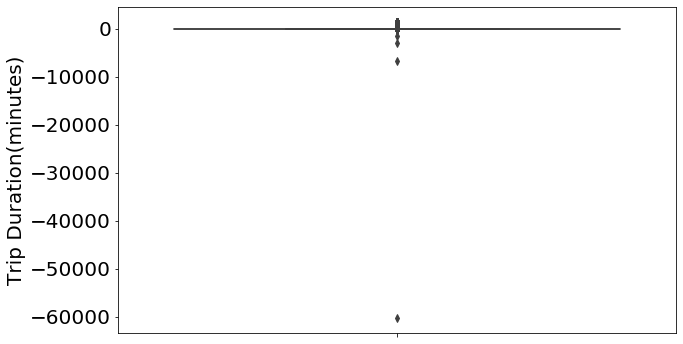

In [0]:
%matplotlib inline
plt.figure(figsize = (10,6))
sns.boxplot("trip_duration", data = new_frame, orient = "v")
# sns.distplot(new_frame[['trip_duration']], hist=False, rug=True)
plt.tick_params(labelsize = 20)
plt.ylabel("Trip Duration(minutes)", fontsize = 20)
plt.show()

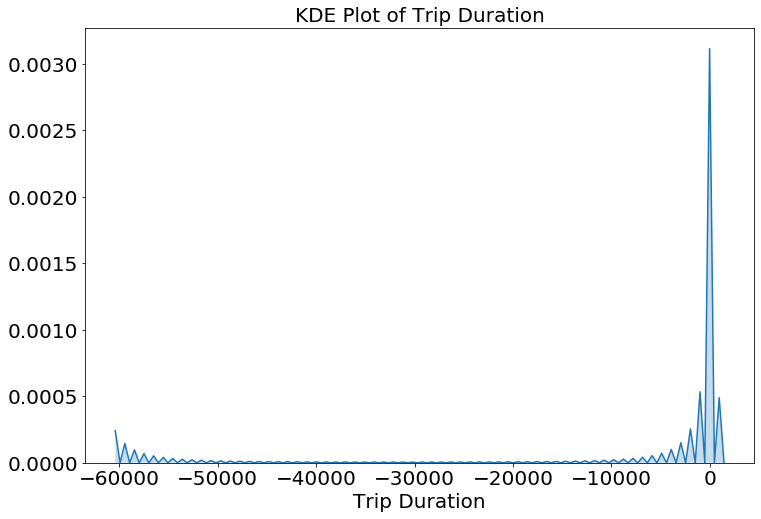

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame["trip_duration"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Trip Duration", fontsize = 20)
plt.title("KDE Plot of Trip Duration", fontsize = 20)
plt.show()

In [0]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
var =new_frame["trip_duration"].values
var = np.sort(var,axis = None)
for i in range(0,100,10):

    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is -60400.25
10 percentile value is 3.9166666666666665
20 percentile value is 5.5
30 percentile value is 7.0
40 percentile value is 8.566666666666666
50 percentile value is 10.3
60 percentile value is 12.366666666666667
70 percentile value is 15.0
80 percentile value is 18.733333333333334
90 percentile value is 25.416666666666668
100 percentile value is  1439.9333333333334


In [0]:
#looking further from the 99th percecntile
for i in range(90,100):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 25.416666666666668
91 percentile value is 26.45
92 percentile value is 27.65
93 percentile value is 29.016666666666666
94 percentile value is 30.616666666666667
95 percentile value is 32.55
96 percentile value is 35.016666666666666
97 percentile value is 38.31666666666667
98 percentile value is 43.266666666666666
99 percentile value is 52.35
100 percentile value is  1439.9333333333334


In [0]:
new_frame_cleaned = new_frame[(new_frame.trip_duration>1) & (new_frame.trip_duration<720)]

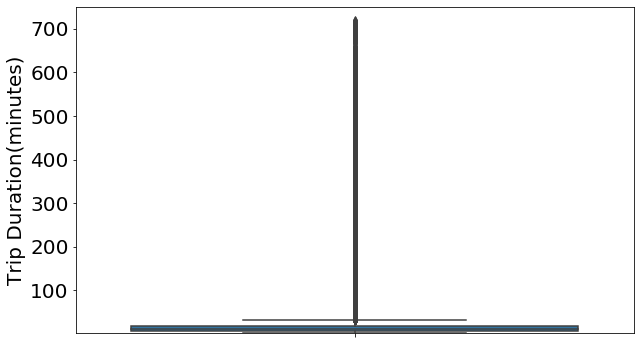

In [0]:
plt.figure(figsize = (10,6))
sns.boxplot("trip_duration", data = new_frame_cleaned, orient = "v")
plt.ylim(ymin = 1, ymax = 750)
plt.tick_params(labelsize = 20)
plt.ylabel("Trip Duration(minutes)", fontsize = 20)
plt.show()

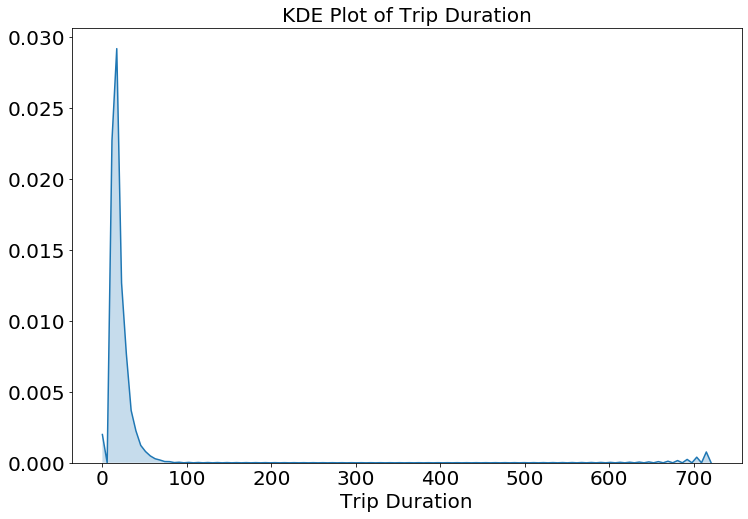

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_cleaned["trip_duration"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Trip Duration", fontsize = 20)
plt.title("KDE Plot of Trip Duration", fontsize = 20)
plt.show()

In [0]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var =new_frame_green["trip_duration"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 3.533333333333333
20 percentile value is 4.966666666666667
30 percentile value is 6.3
40 percentile value is 7.716666666666667
50 percentile value is 9.333333333333334
60 percentile value is 11.3
70 percentile value is 13.8
80 percentile value is 17.316666666666666
90 percentile value is 23.6
100 percentile value is  1439.9


In [0]:
#looking further from the 99th percecntile
for i in range(90,100):
    var =new_frame_green["trip_duration"]
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.6
91 percentile value is 24.583333333333332
92 percentile value is 25.75
93 percentile value is 27.05
94 percentile value is 28.616666666666667
95 percentile value is 30.533333333333335
96 percentile value is 32.95
97 percentile value is 36.46666666666667
98 percentile value is 42.28333333333333
99 percentile value is 59.083333333333336
100 percentile value is  1439.9


In [0]:
new_frame_green_cleaned = new_frame_green[(new_frame_green.trip_duration>1) & (new_frame_green.trip_duration<720)]

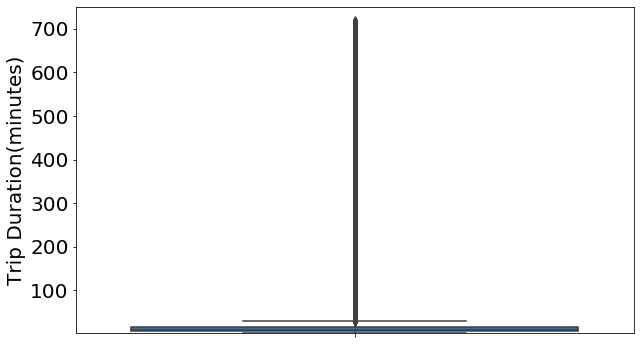

In [0]:
plt.figure(figsize = (10,6))
sns.boxplot("trip_duration", data = new_frame_green_cleaned, orient = "v")
plt.ylim(ymin = 1, ymax = 750)
plt.tick_params(labelsize = 20)
plt.ylabel("Trip Duration(minutes)", fontsize = 20)
plt.show()

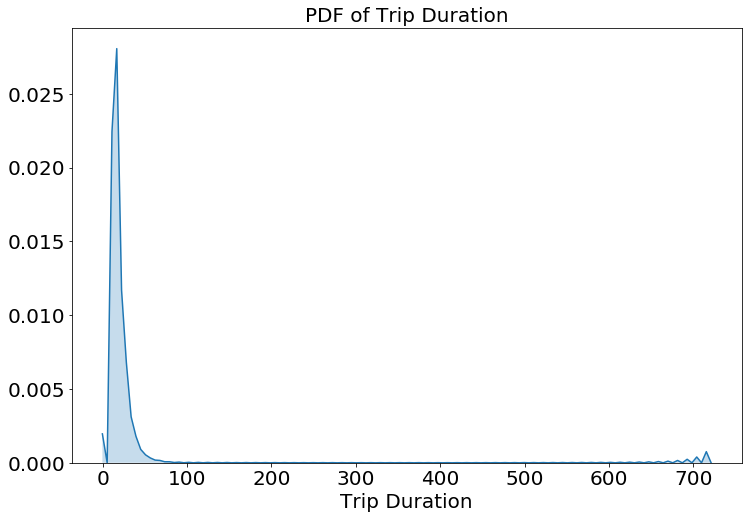

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_green_cleaned["trip_duration"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Trip Duration", fontsize = 20)
plt.title("PDF of Trip Duration", fontsize = 20)
plt.show()

# Speed outlier reduction


In [0]:
def changingLabels(num):
    if num < 10**3:
        return num
    elif num>=10**3 and num < 10**6:
        return str(num/10**3)+"k"
    elif num>=10**6 and num < 10**9:
        return str(num/10**6) + "M"
    else:
        return str(num/10**9) + "B"
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_frame_cleaned, orient = "v")

ax.set_yticklabels([changingLabels(num) for num in ax.get_yticks()])
plt.tick_params(labelsize = 20)
plt.ylabel("Speed(Miles/hr) in Millions", fontsize = 20)
plt.show()

<IPython.core.display.Javascript object>

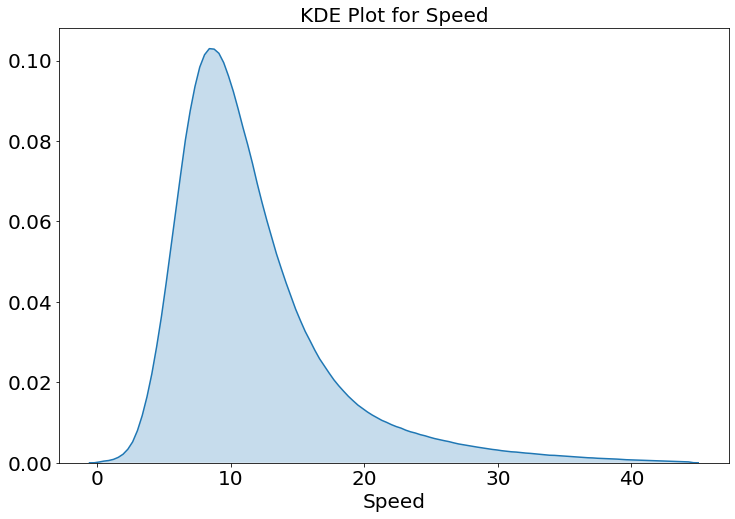

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_cleaned["speed"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Speed", fontsize = 20)
plt.title("KDE Plot for Speed", fontsize = 20)
plt.show()

In [0]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var =new_frame_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.003133159268929504
10 percentile value is 5.957924263674616
20 percentile value is 7.217932752179327
30 percentile value is 8.232848232848234
40 percentile value is 9.204545454545457
50 percentile value is 10.23411371237458
60 percentile value is 11.416490486257928
70 percentile value is 12.903370786516852
80 percentile value is 15.048231511254018
90 percentile value is 19.148936170212764
100 percentile value is  44.424131627056674


In [0]:
for i in range(90,100):
    var =new_frame_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 19.3437125748503
91 percentile value is 20.062052505966587
92 percentile value is 20.887372013651873
93 percentile value is 21.833568406205924
94 percentile value is 22.934860415175375
95 percentile value is 24.240300375469335
96 percentile value is 25.815016322089228
97 percentile value is 27.818181818181813
98 percentile value is 30.55813953488372
99 percentile value is 34.75504322766571
100 percentile value is  2131.9480519480517


In [0]:
for i in np.arange(0.0, 1.0, 0.1):
    var =new_frame_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 34.75504322766571
99.1 percentile value is 35.33168316831683
99.2 percentile value is 35.957870099473375
99.3 percentile value is 36.64670658682635
99.4 percentile value is 37.40851553509781
99.5 percentile value is 38.27174530983513
99.6 percentile value is 39.25888324873097
99.7 percentile value is 40.48780487804878
99.8 percentile value is 42.048
99.9 percentile value is 44.42448979591837
100 percentile value is  2131.9480519480517


In [0]:
new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.speed>0) & (new_frame_cleaned.speed<44.42448979591837)]

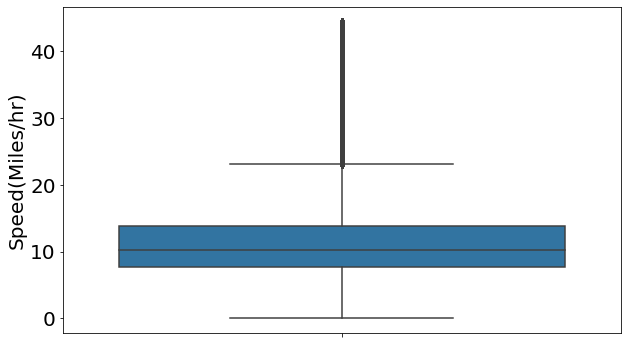

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_frame_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Speed(Miles/hr)", fontsize = 20)
plt.show()

In [0]:
Average_speed = sum(new_frame_cleaned.speed)/len(new_frame_cleaned.speed)
print("Average Speed of Taxis around NYC = "+str(Average_speed))

Average Speed of Taxis around NYC = 11.711656241587644


In [0]:
print("Speed of Taxis around NYC per 10 minutes = "+str(Average_speed/6)+" per 10 minutes.")

Speed of Taxis around NYC per 10 minutes = 1.951942706931274 per 10 minutes.


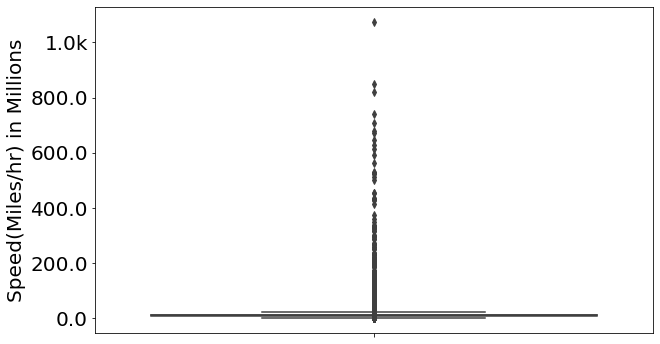

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_frame_green_cleaned, orient = "v")

ax.set_yticklabels([changingLabels(num) for num in ax.get_yticks()])
plt.tick_params(labelsize = 20)
plt.ylabel("Speed(Miles/hr) in Millions", fontsize = 20)
plt.show()

In [0]:
for i in range(0,100,10):
    var =new_frame_green_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 7.304347826086956
20 percentile value is 8.593548387096774
30 percentile value is 9.572254335260116
40 percentile value is 10.466960352422909
50 percentile value is 11.37546468401487
60 percentile value is 12.387096774193548
70 percentile value is 13.620951068228809
80 percentile value is 15.401069518716579
90 percentile value is 18.908737864077672
100 percentile value is  1074.2857142857142


In [0]:
for i in range(90,100):
    var =new_frame_green_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 18.908737864077672
91 percentile value is 19.50501672240803
92 percentile value is 20.188235294117646
93 percentile value is 20.978417266187048
94 percentile value is 21.886363636363637
95 percentile value is 22.965108624094796
96 percentile value is 24.263736263736263
97 percentile value is 25.919999999999995
98 percentile value is 28.112359550561795
99 percentile value is 31.72114285714286
100 percentile value is  1074.2857142857142


In [0]:
for i in np.arange(0.0, 1.0, 0.1):
    var =new_frame_green_cleaned["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 31.72114285714286
99.1 percentile value is 32.256637168141594
99.2 percentile value is 32.81739130434783
99.3 percentile value is 33.44337811900191
99.4 percentile value is 34.14557670772677
99.5 percentile value is 35.0
99.6 percentile value is 36.03260869565218
99.7 percentile value is 37.32841328413284
99.8 percentile value is 39.179104477611936
99.9 percentile value is 42.373540856031134
100 percentile value is  1074.2857142857142


In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.speed>0) & (new_frame_green_cleaned.speed<42.373540856031134)]

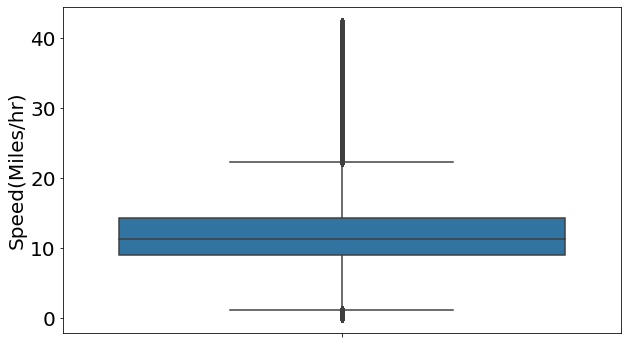

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_frame_green_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Speed(Miles/hr)", fontsize = 20)
plt.show()

In [0]:
Average_speed = sum(new_frame_green_cleaned.speed)/len(new_frame_green_cleaned.speed)
print("Average Speed of Taxis around NYC = "+str(Average_speed))

Average Speed of Taxis around NYC = 12.450669177936868


In [0]:
print("Speed of Taxis around NYC per 10 minutes = "+str(Average_speed/6)+" per 10 minutes.")

Speed of Taxis around NYC per 10 minutes = 2.075111529656145 per 10 minutes.


# Distance outlier reduction


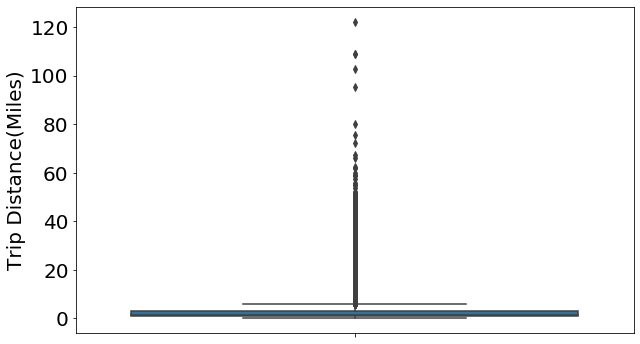

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_frame_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Distance(Miles)", fontsize = 20)
plt.show()

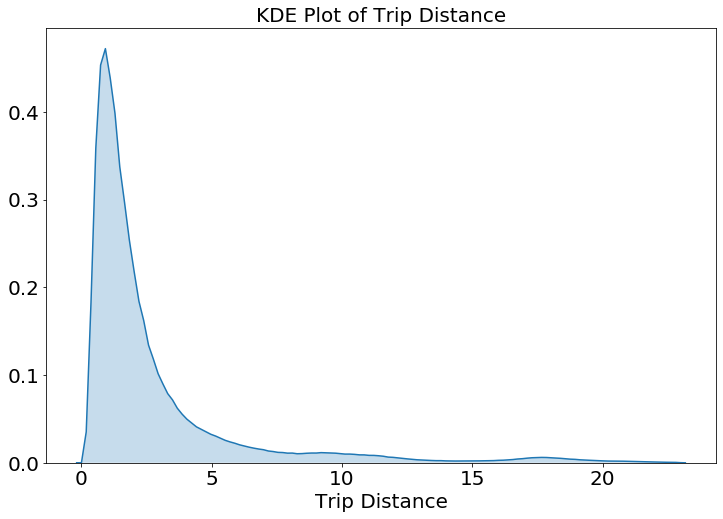

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_cleaned["trip_distance"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Trip Distance", fontsize = 20)
plt.title("KDE Plot of Trip Distance", fontsize = 20)
plt.show()

In [0]:
for i in range(0,100,10):
    var =new_frame_cleaned["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.62
20 percentile value is 0.86
30 percentile value is 1.09
40 percentile value is 1.3
50 percentile value is 1.6
60 percentile value is 1.98
70 percentile value is 2.5
80 percentile value is 3.5
90 percentile value is 6.2
100 percentile value is  122.25


In [0]:
for i in range(90,100):
    var =new_frame_cleaned["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 6.2
91 percentile value is 6.77
92 percentile value is 7.5
93 percentile value is 8.4
94 percentile value is 9.3
95 percentile value is 10.2
96 percentile value is 11.3
97 percentile value is 13.19
98 percentile value is 16.84
99 percentile value is 18.52
100 percentile value is  122.25


In [0]:
for i in np.arange(0.0, 1.0, 0.1):
    var =new_frame_cleaned["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.52
99.1 percentile value is 18.75
99.2 percentile value is 19.0
99.3 percentile value is 19.28
99.4 percentile value is 19.6
99.5 percentile value is 19.99
99.6 percentile value is 20.43
99.7 percentile value is 20.96
99.8 percentile value is 21.6
99.9 percentile value is 22.9
100 percentile value is  122.25


In [0]:
new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.trip_distance>0) & (new_frame_cleaned.trip_distance<23)]

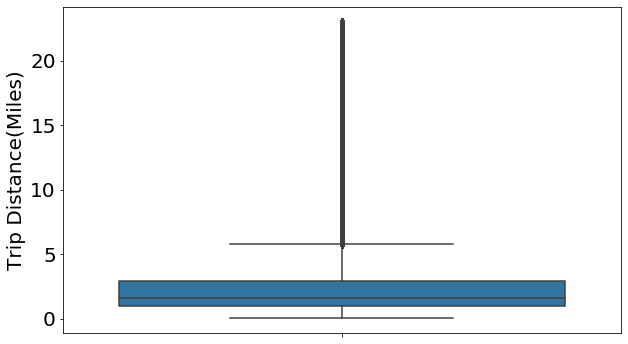

In [0]:
#plot of trip distance after removing outlier points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_frame_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Distance(Miles)", fontsize = 20)
plt.show()

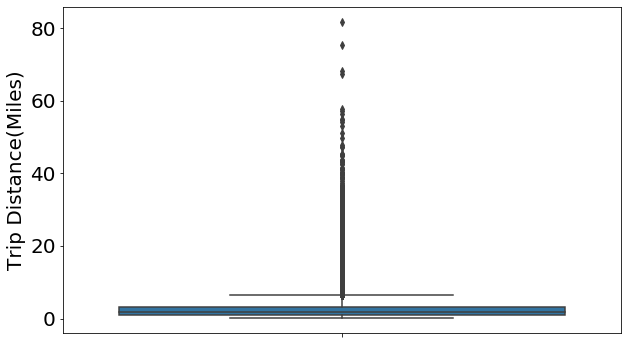

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_frame_green_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Distance(Miles)", fontsize = 20)
plt.show()

In [0]:
for i in range(0,100,10):
    var =new_frame_green_cleaned["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.66
20 percentile value is 0.89
30 percentile value is 1.1
40 percentile value is 1.37
50 percentile value is 1.7
60 percentile value is 2.13
70 percentile value is 2.77
80 percentile value is 3.71
90 percentile value is 5.69
100 percentile value is  81.7


In [0]:
for i in range(90,100):
    var =new_frame_green_cleaned["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 5.69
91 percentile value is 6.0
92 percentile value is 6.31
93 percentile value is 6.7
94 percentile value is 7.11
95 percentile value is 7.6
96 percentile value is 8.21
97 percentile value is 9.07
98 percentile value is 10.34
99 percentile value is 12.89
100 percentile value is  81.7


In [0]:
quantile_tripDistance = new_frame_cleaned.trip_distance.quantile(np.round(np.arange(0.991, 1.001, 0.001), 4))
qValues = np.round(np.arange(0.991, 1.001, 0.001), 3)
for i in qValues:
    print("{} percentile value of trip distance is {}".format((i*100), quantile_tripDistance[i]))

99.1 percentile value of trip distance is 18.54
99.2 percentile value of trip distance is 18.76
99.3 percentile value of trip distance is 19.0
99.4 percentile value of trip distance is 19.29
99.5 percentile value of trip distance is 19.6
99.6 percentile value of trip distance is 20.0
99.7 percentile value of trip distance is 20.46
99.8 percentile value of trip distance is 20.99
99.9 percentile value of trip distance is 21.64
100.0 percentile value of trip distance is 22.99


In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.trip_distance>0) & (new_frame_green_cleaned.trip_distance<23)]

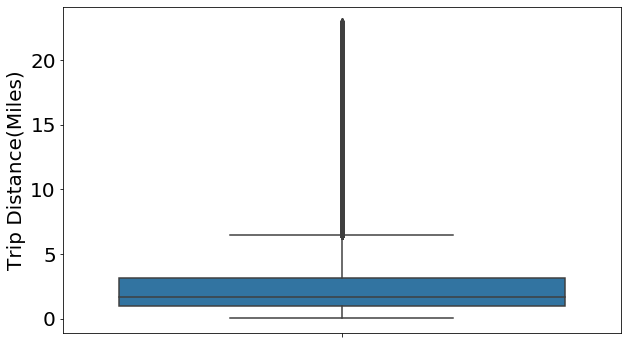

In [0]:
#plot of trip distance after removing outlier points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_frame_green_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Distance(Miles)", fontsize = 20)
plt.show()

# Fare amount outlier reduction

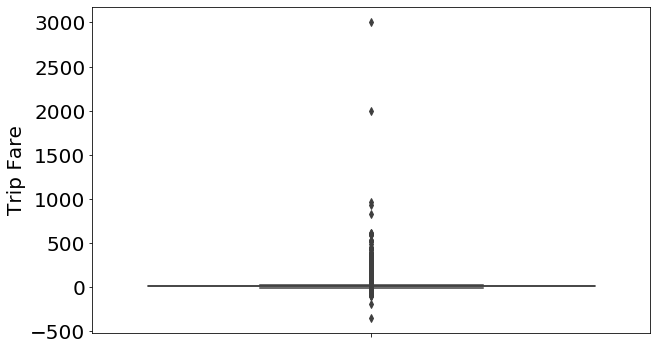

In [0]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("total_amount", data = new_frame_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Fare", fontsize = 20)
plt.show()

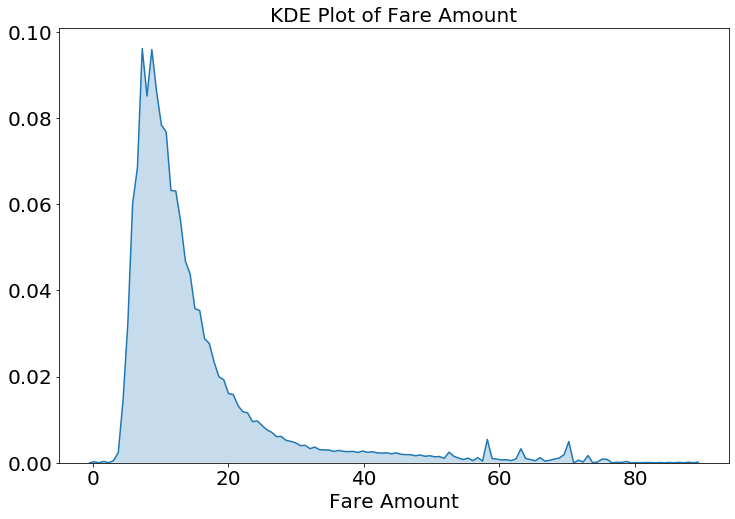

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_cleaned["total_amount"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Fare Amount", fontsize = 20)
plt.title("KDE Plot of Fare Amount", fontsize = 20)
plt.show()

In [0]:
quantile_totalAmount = new_frame_cleaned.total_amount.quantile(np.round(np.arange(0.00, 1.01, 0.01), 2))

In [0]:
qValues = np.round(np.arange(0.00, 1.01, 0.1), 2)
for i in qValues:
    print("{}th percentile value of trip fare is {}".format(int(i*100), quantile_totalAmount[i]))

0th percentile value of trip fare is -350.3
10th percentile value of trip fare is 6.62
20th percentile value of trip fare is 7.8
30th percentile value of trip fare is 8.8
40th percentile value of trip fare is 9.96
50th percentile value of trip fare is 11.3
60th percentile value of trip fare is 12.95
70th percentile value of trip fare is 15.3
80th percentile value of trip fare is 18.8
90th percentile value of trip fare is 27.25
100th percentile value of trip fare is 3009.8


In [0]:
qValues = np.round(np.arange(0.91, 1.01, 0.01), 3)
for i in qValues:
    print("{} percentile value of trip fare is {}".format(int(i*100), quantile_totalAmount[i]))

91 percentile value of trip fare is 28.800000000000004
92 percentile value of trip fare is 30.96
93 percentile value of trip fare is 33.95
94 percentile value of trip fare is 37.55
95 percentile value of trip fare is 41.34
96 percentile value of trip fare is 45.96
97 percentile value of trip fare is 52.01
98 percentile value of trip fare is 58.34
99 percentile value of trip fare is 68.76
100 percentile value of trip fare is 3009.8


In [0]:
quantile_totalAmount = new_frame_cleaned.total_amount.quantile(np.round(np.arange(0.991, 1.001, 0.001), 3))
qValues = np.round(np.arange(0.991, 1.001, 0.001), 3)
for i in qValues:
    print("{} percentile value of trip fare is {}".format((i*100), quantile_totalAmount[i]))

99.1 percentile value of trip fare is 69.99
99.2 percentile value of trip fare is 69.99
99.3 percentile value of trip fare is 70.01
99.4 percentile value of trip fare is 70.01
99.5 percentile value of trip fare is 70.84
99.6 percentile value of trip fare is 72.92
99.7 percentile value of trip fare is 75.39
99.8 percentile value of trip fare is 76.49
99.9 percentile value of trip fare is 88.56
100.0 percentile value of trip fare is 3009.8


In [0]:
new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.total_amount>0) & (new_frame_cleaned.total_amount<88.57)]

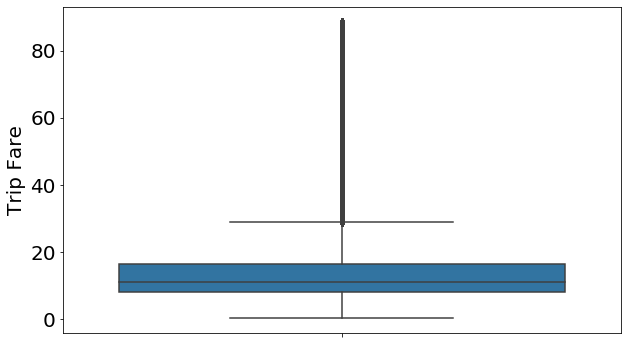

In [0]:
#plot of fare amount after removing outliers and erroneous points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("total_amount", data = new_frame_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Fare", fontsize = 20)
plt.show()

In [0]:
quantile_totalAmount = new_frame_green_cleaned.total_amount.quantile(np.round(np.arange(0.00, 1.01, 0.01), 2))

In [0]:
qValues = np.round(np.arange(0.00, 1.01, 0.1), 2)
for i in qValues:
    print("{}th percentile value of trip fare is {}".format(int(i*100), quantile_totalAmount[i]))

0th percentile value of trip fare is -153.9
10th percentile value of trip fare is 6.3
20th percentile value of trip fare is 7.299999999999999
30th percentile value of trip fare is 8.3
40th percentile value of trip fare is 9.3
50th percentile value of trip fare is 10.56
60th percentile value of trip fare is 12.3
70th percentile value of trip fare is 14.75
80th percentile value of trip fare is 17.91
90th percentile value of trip fare is 24.4
100th percentile value of trip fare is 325.8


In [0]:
qValues = np.round(np.arange(0.91, 1.01, 0.01), 3)
for i in qValues:
    print("{} percentile value of trip fare is {}".format(int(i*100), quantile_totalAmount[i]))

91 percentile value of trip fare is 25.55
92 percentile value of trip fare is 26.76
93 percentile value of trip fare is 27.88
94 percentile value of trip fare is 29.3
95 percentile value of trip fare is 31.0
96 percentile value of trip fare is 33.3
97 percentile value of trip fare is 36.0
98 percentile value of trip fare is 40.01
99 percentile value of trip fare is 47.91
100 percentile value of trip fare is 325.8


In [0]:
quantile_totalAmount = new_frame_green_cleaned.total_amount.quantile(np.round(np.arange(0.991, 1.001, 0.001), 3))
qValues = np.round(np.arange(0.991, 1.001, 0.001), 3)
for i in qValues:
    print("{} percentile value of trip fare is {}".format((i*100), quantile_totalAmount[i]))

99.1 percentile value of trip fare is 49.3
99.2 percentile value of trip fare is 50.75
99.3 percentile value of trip fare is 52.34
99.4 percentile value of trip fare is 54.18
99.5 percentile value of trip fare is 56.34
99.6 percentile value of trip fare is 58.8
99.7 percentile value of trip fare is 62.3
99.8 percentile value of trip fare is 67.01
99.9 percentile value of trip fare is 72.92
100.0 percentile value of trip fare is 325.8


In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.total_amount>0) & (new_frame_green_cleaned.total_amount<73)]

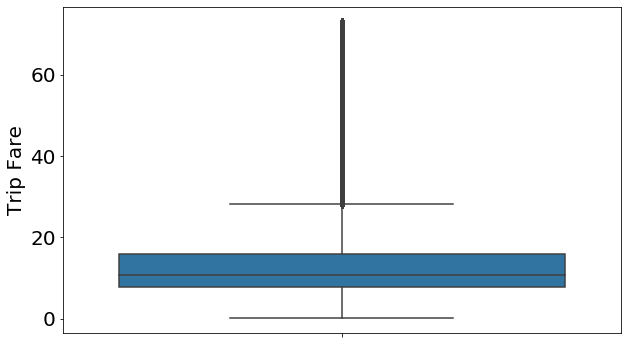

In [0]:
#plot of fare amount after removing outliers and erroneous points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("total_amount", data = new_frame_green_cleaned, orient = "v")

plt.tick_params(labelsize = 20)
plt.ylabel("Trip Fare", fontsize = 20)
plt.show()

# Pickup and dropoffs outlier mapping


In [0]:
outside_NYC_yellow_pickup = df[((df.pickup_latitude <= 40.5774) | (df.pickup_longitude <= -74.15) | (df.pickup_latitude >= 40.9176) | (df.pickup_longitude >= -73.7004))]
outside_NYC_green_pickup = df_green[((df_green.pickup_latitude <= 40.5774) | (df_green.pickup_longitude <= -74.15) | (df_green.pickup_latitude >= 40.9176) | (df_green.pickup_longitude >= -73.7004))]
outside_NYC_yellow_dropoff = df[((df.dropoff_latitude <= 40.5774) | (df.dropoff_longitude <= -74.15) | (df.dropoff_latitude >= 40.9176) | (df.dropoff_longitude >= -73.7004))]
outside_NYC_green_dropoff = df_green[((df_green.dropoff_latitude <= 40.5774) | (df_green.dropoff_longitude <= -74.15) | (df_green.dropoff_latitude >= 40.9176) | (df_green.dropoff_longitude >= -73.7004))]


In [0]:
df_green.shape

(1075224, 26)

In [0]:
m = folium.Map(location = [40.5774, -73.7004])


for i,j in outside_NYC_yellow_pickup.iterrows():
    if j["pickup_latitude"] != 0:
        folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='orange')).add_to(m)


for i,j in outside_NYC_green_pickup.iterrows():
    if j["pickup_latitude"] != 0:
        folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='green')).add_to(m)

# for i,j in outside_NYC_yellow_dropoff.head(10000).iterrows():
#     if j["pickup_latitude"] != 0:
#         folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='red')).add_to(m)

# for i,j in outside_NYC_green_dropoff.head(10000).iterrows():
#     if j["pickup_latitude"] != 0:
#         folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='blue')).add_to(m)

# folium.TileLayer('Mapbox Control Room').add_to(m)
m

In [0]:
m = folium.Map(location = [40.5774, -73.7004])


# for i,j in outside_NYC_yellow.head(10000).iterrows():
#     if j["pickup_latitude"] != 0:
#         folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='yellow')).add_to(m)


# for i,j in outside_NYC_green.head(10000).iterrows():
#     if j["pickup_latitude"] != 0:
#         folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='green')).add_to(m)

for i,j in outside_NYC_yellow_dropoff.iterrows():
    if j["pickup_latitude"] != 0:
        folium.Marker([j["pickup_latitude"], j["pickup_longitude"]]).add_to(m)

# for i,j in outside_NYC_green_dropoff.head(10000).iterrows():
#     if j["pickup_latitude"] != 0:
#         folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='blue')).add_to(n)

# folium.TileLayer('Mapbox Control Room').add_to(m)
m

In [0]:
outside_NYC_yellow_dropoff.head()

,Unnamed: 0,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_longitude,pickup_latitude,pickup_borough,pickup_zone,dropoff_longitude,dropoff_latitude,dropoff_borough,dropoff_zone
3528318,3528318,1,2017-01-01 07:24:32,2017-01-01 08:05:43,1,21.10,3,N,263,1,1,75.5,0.0,0.0,15.0,10.5,0.3,101.3,-73.951209,40.778494,Manhattan,Yorkville West,-74.176779,40.689515,EWR,Newark Airport
3528319,3528319,2,2017-01-01 15:01:06,2017-01-01 15:42:55,1,19.47,1,N,263,1,2,56.0,0.0,0.5,0.0,12.5,0.3,69.3,-73.951209,40.778494,Manhattan,Yorkville West,-74.176779,40.689515,EWR,Newark Airport
3528320,3528320,1,2017-01-01 17:11:27,2017-01-01 17:58:15,2,28.60,5,N,263,1,1,100.0,0.0,0.0,20.0,12.5,0.3,132.8,-73.951209,40.778494,Manhattan,Yorkville West,-74.176779,40.689515,EWR,Newark Airport
3528321,3528321,2,2017-01-01 16:39:31,2017-01-01 17:21:42,1,19.98,3,N,263,1,1,72.0,0.0,0.0,10.0,12.5,0.3,94.8,-73.951209,40.778494,Manhattan,Yorkville West,-74.176779,40.689515,EWR,Newark Airport
3528322,3528322,2,2017-01-01 16:44:09,2017-01-01 17:27:49,1,21.10,3,N,263,1,1,77.0,0.0,0.0,23.7,17.5,0.3,118.5,-73.951209,40.778494,Manhattan,Yorkville West,-74.176779,40.689515,EWR,Newark Airport


# Ensuring all pickups and dropoffs are inside ny

In [0]:
new_frame_cleaned = new_frame_cleaned[(((new_frame_cleaned.pickup_latitude >= 40.5774) & (new_frame_cleaned.pickup_latitude <= 40.9176)) & ((new_frame_cleaned.pickup_longitude >= -74.15) & (new_frame_cleaned.pickup_longitude <= -73.7004)))]

In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(((new_frame_green_cleaned.pickup_latitude >= 40.5774) & (new_frame_green_cleaned.pickup_latitude <= 40.9176)) & ((new_frame_green_cleaned.pickup_longitude >= -74.15) & (new_frame_green_cleaned.pickup_longitude <= -73.7004)))]

In [0]:
m = folium.Map(location = [40.9176, -73.7004])

pickups_within_NYC_yello = new_frame_cleaned.sample(n = 500)
pickups_within_NYC_green = new_frame_green_cleaned.sample(n = 500)

for i,j in pickups_within_NYC_yello.iterrows():
    folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='orange')).add_to(m)
for i,j in pickups_within_NYC_green.iterrows():
    folium.Marker([j["pickup_latitude"], j["pickup_longitude"]], icon=folium.Icon(color='green')).add_to(m)
m

In [0]:
new_frame_cleaned = new_frame_cleaned[(((new_frame_cleaned.dropoff_latitude >= 40.5774) & (new_frame_cleaned.dropoff_latitude <= 40.9176)) & ((new_frame_cleaned.dropoff_longitude >= -74.15) & (new_frame_cleaned.dropoff_longitude <= -73.7004)))]

In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(((new_frame_green_cleaned.dropoff_latitude >= 40.5774) & (new_frame_green_cleaned.dropoff_latitude <= 40.9176)) & ((new_frame_green_cleaned.dropoff_longitude >= -74.15) & (new_frame_green_cleaned.dropoff_longitude <= -73.7004)))]

In [0]:
new_frame_cleaned.columns

Index(['Unnamed: 0', 'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'total_amount', 'trip_duration', 'pickup_time', 'speed',
       'pickup_cluster'],
      dtype='object')

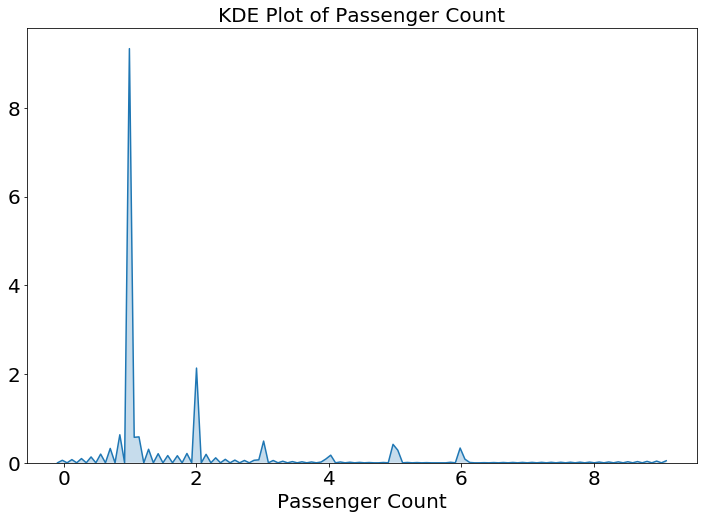

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_frame_cleaned["passenger_count"].values, shade = True, cumulative = False)
plt.tick_params(labelsize = 20)
plt.xlabel("Passenger Count", fontsize = 20)
plt.title("KDE Plot of Passenger Count", fontsize = 20)
plt.show()

In [0]:
quantile_totalAmount = new_frame_cleaned.passenger_count.quantile(np.round(np.arange(0.00, 1.01, 0.01), 2))

In [0]:
qValues = np.round(np.arange(0.00, 1.01, 0.1), 2)
for i in qValues:
    print("{}th percentile value of passenger count is {}".format(int(i*100), quantile_totalAmount[i]))

0th percentile value of passenger count is 0.0
10th percentile value of passenger count is 1.0
20th percentile value of passenger count is 1.0
30th percentile value of passenger count is 1.0
40th percentile value of passenger count is 1.0
50th percentile value of passenger count is 1.0
60th percentile value of passenger count is 1.0
70th percentile value of passenger count is 1.0
80th percentile value of passenger count is 2.0
90th percentile value of passenger count is 3.0
100th percentile value of passenger count is 9.0


In [0]:
new_frame_cleaned = new_frame_cleaned[(new_frame_cleaned.passenger_count>0)]

In [0]:
new_frame_green_cleaned = new_frame_green_cleaned[(new_frame_green_cleaned.passenger_count>0)]

In [0]:
print("Fraction of cleaned points for yellow cabs",str(new_frame_cleaned.shape[0]/new_frame.shape[0]))

Fraction of cleaned points for yellow cabs 0.9874294000699313


In [0]:
print("Fraction of cleaned points for green cabs",str(new_frame_green_cleaned.shape[0]/new_frame_green.shape[0]))

Fraction of cleaned points for green cabs 0.974738287091806


In [0]:
print("Total number of outliers and erroneous points removed for yellow cabs= ",str(new_frame.shape[0] - new_frame_cleaned.shape[0]))

Total number of outliers and erroneous points removed for yellow cabs=  119610


In [0]:
print("Total number of outliers and erroneous points removed for green cabs = ",str(new_frame_green.shape[0] - new_frame_green_cleaned.shape[0]))

Total number of outliers and erroneous points removed for green cabs =  27162


# Clustering

In [0]:
def min_distance(regionCenters, totalClusters):
    good_points = 0
    bad_points = 0
    less_dist = []
    more_dist = []
    min_distance = 100000  #any big number can be given here
    for i in range(totalClusters):
        good_points = 0
        bad_points = 0
        for j in range(totalClusters):
            if j != i:
                distance = gpxpy.geo.haversine_distance(latitude_1 = regionCenters[i][0], longitude_1 = regionCenters[i][1], latitude_2 = regionCenters[j][0], longitude_2 = regionCenters[j][1])
                #you can check the documentation of above "gpxpy.geo.haversine_distance" at "https://github.com/tkrajina/gpxpy/blob/master/gpxpy/geo.py"
                #"gpxpy.geo.haversine_distance" gives distance between two latitudes and longitudes in meters. So, we have to convert it into miles.
                distance = distance/(1.60934*1000)   #distance from meters to miles
                min_distance = min(min_distance, distance) #it will return minimum of "min_distance, distance".
                if distance < 2:
                    good_points += 1
                else:
                    bad_points += 1
        less_dist.append(good_points)
        more_dist.append(bad_points)
    print("On choosing a cluster size of {}".format(totalClusters))
    print("Avg. Number clusters within vicinity where inter cluster distance < 2 miles is {}".format(np.ceil(sum(less_dist)/len(less_dist))))
    print("Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is {}".format(np.ceil(sum(more_dist)/len(more_dist))))
    print("Minimum distance between any two clusters = {}".format(min_distance))
    print("-"*10)
            
def makingRegions(noOfRegions, coord):
    regions = MiniBatchKMeans(n_clusters = noOfRegions, batch_size = 10000 ,random_state=0).fit(coord)
    regionCenters = regions.cluster_centers_ 
    totalClusters = len(regionCenters)
    return regionCenters, totalClusters

In [0]:
coord = new_frame_cleaned[["pickup_latitude", "pickup_longitude"]].values
neighbors = []

In [0]:
coord_green = new_frame_green_cleaned[["pickup_latitude", "pickup_longitude"]].values
# neighbors = []

In [0]:
startTime = datetime.now()
for i in range(10, 100, 10):
    regionCenters, totalClusters = makingRegions(i, coord)
    min_distance(regionCenters, totalClusters)
print("Time taken = "+str(datetime.now() - startTime))

On choosing a cluster size of 10
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 2.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 8.0
Minimum distance between any two clusters = 1.0361011035510903
----------
On choosing a cluster size of 20
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 4.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 16.0
Minimum distance between any two clusters = 0.7028738052666403
----------
On choosing a cluster size of 30
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 7.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 23.0
Minimum distance between any two clusters = 0.4649018267517064
----------
On choosing a cluster size of 40
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 10.0
Avg. Number clusters outside of vicinity where int

In [0]:
startTime = datetime.now()
for i in range(10, 100, 10):
    regionCenters, totalClusters = makingRegions(i, coord_green)
    min_distance(regionCenters, totalClusters)
print("Time taken = "+str(datetime.now() - startTime))

On choosing a cluster size of 10
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 0.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 9.0
Minimum distance between any two clusters = 2.159156172821809
----------
On choosing a cluster size of 20
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 2.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 18.0
Minimum distance between any two clusters = 0.9866480244730707
----------
On choosing a cluster size of 30
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 3.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 27.0
Minimum distance between any two clusters = 0.9207355355493346
----------
On choosing a cluster size of 40
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 3.0
Avg. Number clusters outside of vicinity where inter

In [0]:
coord = new_frame_cleaned[["pickup_latitude", "pickup_longitude"]].values
regions = MiniBatchKMeans(n_clusters = 30, batch_size = 10000).fit(coord)


In [0]:
# regions_dbscan = DBSCAN().fit(coord)

In [0]:
new_frame_cleaned["pickup_cluster"] = regions.predict(new_frame_cleaned[["pickup_latitude", "pickup_longitude"]])

In [0]:
coord_Green = new_frame_green_cleaned[["pickup_latitude", "pickup_longitude"]].values
regions_green = MiniBatchKMeans(n_clusters = 40, batch_size = 10000).fit(coord_Green)
new_frame_green_cleaned["pickup_cluster"] = regions_green.predict(new_frame_green_cleaned[["pickup_latitude", "pickup_longitude"]])

In [0]:
new_frame_cleaned.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,speed,pickup_cluster
0,1,3.30,-73.951209,40.778494,-73.977432,40.758226,15.30,12.283333,1.483960e+09,16.119403,16
1,1,2.65,-73.951209,40.778494,-73.977432,40.758226,12.36,6.583333,1.483257e+09,24.151899,16
2,1,2.10,-73.951209,40.778494,-73.977432,40.758226,11.75,7.000000,1.483260e+09,18.000000,16
3,1,2.90,-73.951209,40.778494,-73.977432,40.758226,11.80,8.866667,1.483260e+09,19.624060,16
4,2,2.73,-73.951209,40.778494,-73.977432,40.758226,11.80,10.150000,1.483261e+09,16.137931,16


In [0]:
centerOfRegions = regions.cluster_centers_
noOfClusters = len(centerOfRegions)
centerOfRegions_green = regions_green.cluster_centers_
noOfClusters_green = len(centerOfRegions_green)
m = folium.Map(location = [40.9176, -73.7004])

for i in range(noOfClusters):
    folium.Marker([centerOfRegions[i][0], centerOfRegions[i][1]], popup = (str(np.round(centerOfRegions[i][0], 2))+", "+str(np.round(centerOfRegions[i][1], 2))), icon=folium.Icon(color='orange')).add_to(m)

for i in range(noOfClusters_green):
    folium.Marker([centerOfRegions_green[i][0], centerOfRegions_green[i][1]], popup = (str(np.round(centerOfRegions_green[i][0], 2))+", "+str(np.round(centerOfRegions_green[i][1], 2))), icon=folium.Icon(color='green')).add_to(m)
# for i,j in new_frame_cleaned.sample(50).iterrows():
#     folium.Marker([j["dropoff_latitude"], j["dropoff_longitude"]], icon=folium.Icon(color='red', icon='info-sign')).add_to(m)
m

In [0]:
#Visualising the clusters on a map
%matplotlib inline
def plot_clusters(frame, centers):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20,10))
    scatter = ax.scatter(frame.pickup_longitude.values, frame.pickup_latitude.values, s=400, lw=0,
               c=frame.pickup_cluster.values, cmap='tab20', alpha=0.2)
    for i,j in centers:
      ax.scatter(j,i,s=1000,c='r',marker='*')
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.colorbar(scatter)
    plt.show()



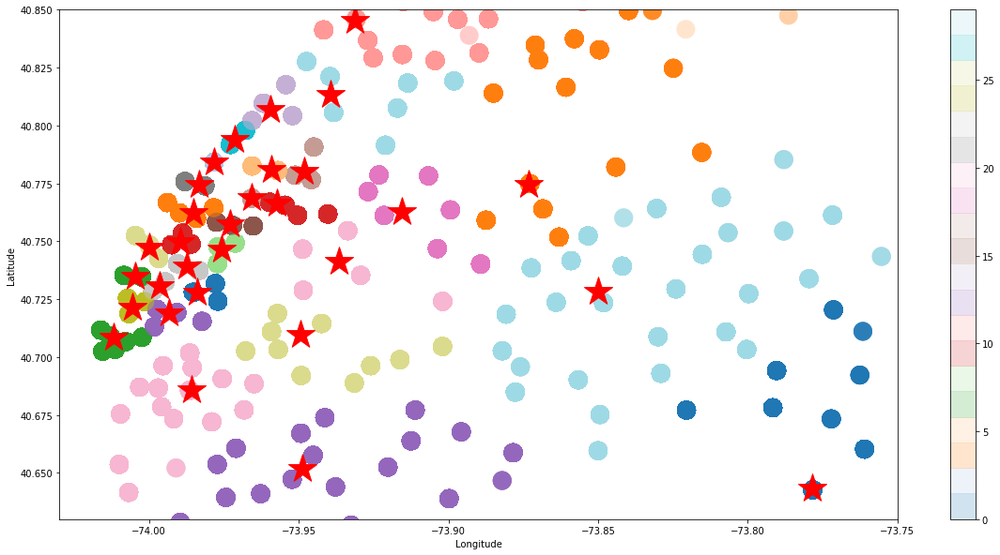

In [0]:
plot_clusters(new_frame_cleaned, centerOfRegions)

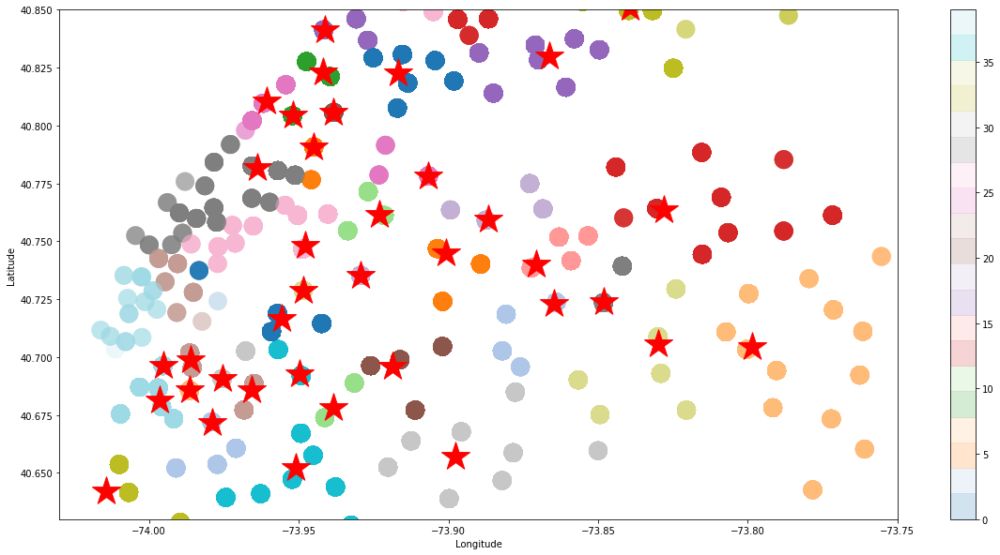

In [0]:
plot_clusters(new_frame_green_cleaned, centerOfRegions_green)

In [0]:
new_frame_cleaned.to_csv(r'/content/drive/My Drive/NYTaxiData/yellow_cab_jan_2017_cleaned.csv')

In [0]:
new_frame_green_cleaned.to_csv(r'/content/drive/My Drive/NYTaxiData/green_cab_jan_2017_cleaned.csv')

#weather data

In [0]:
weather = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/weather data.csv')

In [0]:
weather.dropna()

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,AWND,CDSD,DSND,DSNW,EMNT,EMSD,EMSN,EMXP,EMXT,HDSD,PRCP,PSUN,SNOW,TAVG,TMAX,TMIN,TSUN,WDF2,WDF5,WSF2,WSF5


In [0]:
weather.columns

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'AWND',
       'CDSD', 'DSND', 'DSNW', 'EMNT', 'EMSD', 'EMSN', 'EMXP', 'EMXT', 'HDSD',
       'PRCP', 'PSUN', 'SNOW', 'TAVG', 'TMAX', 'TMIN', 'TSUN', 'WDF2', 'WDF5',
       'WSF2', 'WSF5'],
      dtype='object')

In [0]:
weather = weather[['LATITUDE', 'LONGITUDE', 'AWND',
         'EMNT', 'EMSD', 'EMSN', 'EMXP', 'EMXT', 'HDSD',
       'PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN', 'TSUN']]
weather = weather.fillna(0)

In [0]:
weather.head()

,LATITUDE,LONGITUDE,AWND,EMNT,EMSD,EMSN,EMXP,EMXT,HDSD,PRCP,SNOW,TAVG,TMAX,TMIN,TSUN
0,41.063900,-73.772200,0.0,0.0,0.0,0.0,0.00,0.0,0.0,3.54,0.0,0.0,0.0,0.0,0.0
1,41.019050,-74.233383,0.0,0.0,0.0,0.0,1.33,0.0,0.0,3.77,0.0,0.0,0.0,0.0,0.0
2,40.891740,-74.396350,0.0,6.0,1.0,1.0,1.33,60.0,2895.0,3.91,1.5,34.2,40.5,27.9,0.0
3,40.555400,-74.274000,0.0,0.0,0.0,0.0,1.79,0.0,0.0,5.14,0.0,0.0,0.0,0.0,0.0
4,40.951692,-74.157339,0.0,0.0,3.0,3.1,1.45,0.0,0.0,4.26,4.2,0.0,0.0,0.0,0.0


In [0]:
weather['yellow_clusters']=regions.predict(weather[['LATITUDE', 'LONGITUDE']])

In [0]:
weather['green_clusters']=regions_green.predict(weather[['LATITUDE', 'LONGITUDE']])

In [0]:
weather.groupby('yellow_clusters').count()

,LATITUDE,LONGITUDE,AWND,EMNT,EMSD,EMSN,EMXP,EMXT,HDSD,PRCP,SNOW,TAVG,TMAX,TMIN,TSUN,green_clusters
yellow_clusters,,,,,,,,,,,,,,,,
2,20,20,2,3,2,3,19,3,2,20,3,3,3,3,0,20
4,3,3,1,1,1,1,2,1,1,3,1,1,1,1,0,3
7,2,2,1,1,0,0,2,1,1,2,0,1,1,1,0,2
13,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1
16,4,4,1,1,0,0,3,1,1,4,0,1,1,1,0,4
17,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
19,9,9,1,3,3,3,9,3,3,9,3,3,3,3,0,9
21,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1
24,10,10,0,0,2,4,10,0,0,10,4,0,0,0,0,10


In [0]:
new_frame_cleaned.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,speed,pickup_cluster
0,1,3.30,-73.951209,40.778494,-73.977432,40.758226,15.30,12.283333,1.483960e+09,16.119403,3
1,1,2.65,-73.951209,40.778494,-73.977432,40.758226,12.36,6.583333,1.483257e+09,24.151899,3
2,1,2.10,-73.951209,40.778494,-73.977432,40.758226,11.75,7.000000,1.483260e+09,18.000000,3
3,1,2.90,-73.951209,40.778494,-73.977432,40.758226,11.80,8.866667,1.483260e+09,19.624060,3
4,2,2.73,-73.951209,40.778494,-73.977432,40.758226,11.80,10.150000,1.483261e+09,16.137931,3


# Putting the trips in 10 min time bins

In [0]:
new_frame_cleaned = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_cab_jan_2017_cleaned.csv')

In [0]:
new_frame_cleaned[(new_frame_cleaned.passenger_count<=0)]

,Unnamed: 0,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,speed,pickup_cluster
1031964,1039990,0,0.03,-73.954568,40.765507,-73.959713,40.766839,10.30,1.566667,1.483659e+09,1.148936,24
2215895,2237024,0,0.02,-73.956972,40.780491,-73.956972,40.780491,10.30,1.983333,1.485350e+09,0.605042,5
3374097,3403865,0,11.40,-73.941668,40.841219,-73.985214,40.727944,43.55,26.566667,1.484785e+09,25.746550,15
3618091,3664870,0,0.35,-73.977432,40.758226,-73.978367,40.764425,0.41,9.816667,1.484596e+09,2.139219,10
4102473,4163683,0,0.01,-73.999940,40.748397,-73.999940,40.748397,10.60,6.233333,1.483615e+09,0.096257,6
4339549,4402659,0,0.07,-73.984176,40.759845,-73.984176,40.759845,20.88,6.000000,1.484730e+09,0.700000,14
4705380,4772900,0,0.05,-74.002497,40.734611,-74.002497,40.734611,10.80,6.383333,1.484484e+09,0.469974,26
5873489,5950632,0,0.01,-73.978273,40.784107,-73.978273,40.784107,6.80,3.166667,1.484662e+09,0.189474,17
9371732,9488710,0,1.85,-73.850017,40.659572,-73.850017,40.659572,64.10,11.316667,1.485665e+09,9.808542,1
9392769,9511101,0,8.89,-74.030448,40.623583,-74.137065,40.585664,76.30,16.550000,1.484447e+09,32.229607,21


In [0]:
# 1483228800 : 2017-01-01 00:00:00   (Equivalent unix time)
# 1514764800 : 2018-01-01 00:00:00   (Equivalent unix time)

def pickup_10min_bins(dataframe, month, year):
    pickupTime = dataframe["pickup_time"].values
    unixTime = [1483228800, 1514764800]
    unix_year = unixTime[year-2017]
    time_10min_bin = [int((i - unix_year)/600) for i in pickupTime]
    dataframe["time_bin"] = np.array(time_10min_bin)
    return dataframe

# def add_pickup_bins(frame,month,year):
#      unix_pickup_times=[i for i in frame['pickup_times'].values]
#     unix_times = [[1483228800],\
#                     [1514764800,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
#     start_pickup_unix=unix_times[year-2015][month-1]
#     # https://www.timeanddate.com/time/zones/est
#     # (int((i-start_pickup_unix)/600)+33) : our unix time is in gmt to we are converting it to est
#     tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
#     frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
#     return frame

In [0]:
jan_2017_data = pickup_10min_bins(new_frame_cleaned, 1, 2017)
jan_2017_timeBin_groupBy = jan_2017_data[["pickup_cluster", "time_bin", "trip_distance"]].groupby(by = ["pickup_cluster", "time_bin"]).count()

# jan_2017_data_green = pickup_10min_bins(new_frame_green_cleaned, 1, 2017)
# jan_2017_timeBin_groupBy_green = jan_2017_data_green[["pickup_cluster", "time_bin", "trip_distance"]].groupby(by = ["pickup_cluster", "time_bin"]).count()

In [0]:
jan_2017_timeBin_groupBy = jan_2017_data[["pickup_cluster", "time_bin", "trip_duration"]].groupby(by = ["pickup_cluster", "time_bin"]).count()

In [0]:
jan_2017_timeBin_groupBy.head()

trip_distance
pickup_cluster time_bin               
0              0                    82
               1                   188
               2                   163
               3                   180
               4                   177

In [0]:
jan_2017_timeBin_groupBy.head()

trip_distance
pickup_cluster time_bin               
0              0                    82
               1                   188
               2                   163
               3                   180
               4                   177

In [0]:
jan_2017_timeBin_groupBy = jan_2017_timeBin_groupBy.rename(columns={"trip_distance": "Number_of _trips"}).head()

NameError: ignored

#Load Test Data

In [0]:
startTime = datetime.now()
frame_2018 = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/yellow_taxi_jan_2018.csv')



In [0]:
def prepareTestData(frame):
  print("Number of columns = "+str(len(frame.columns)))
  print("-"*35)

  new_frame2, new_frame_cleaned2 = prepareForYellowCab(frame)

  new_frame_cleaned2["pickup_cluster"] = regions.predict(new_frame_cleaned2[["pickup_latitude", "pickup_longitude"]])
  print("Pickup Clusters are assigned")
  print("-"*35)

  data = pickup_10min_bins(new_frame_cleaned2, 1, 2016)
  print("Pickup time bins are assigned")
  print("-"*35)
  timeBin_groupBy = data[["pickup_cluster", "time_bin", "trip_distance"]].groupby(by = ["pickup_cluster", "time_bin"]).count()
  print("Pickup cluster and time bins are grouped.")
  print("-"*35)

  print("Done...")
  print("-"*35)

  print("Fraction of Total data left = "+str(new_frame_cleaned2.shape[0]/new_frame2.shape[0]))
  print("Total Number of outliers removed = "+str(new_frame2.shape[0] - new_frame_cleaned2.shape[0]))
  print("-"*35)

  print("Total Time taken for execution = "+str(datetime.now() - startTime))
  return data, timeBin_groupBy

In [0]:
jan_2018_data, jan_2018_timeBin_groupBy = prepareTestData(frame_2018)


Number of columns = 26
-----------------------------------
Time taken for creation of dataframe is 0:05:51.190637
Pickup Clusters are assigned
-----------------------------------
Pickup time bins are assigned
-----------------------------------
Pickup cluster and time bins are grouped.
-----------------------------------
Done...
-----------------------------------
Fraction of Total data left = 0.9804778554438839
Total Number of outliers removed = 167442
-----------------------------------
Total Time taken for execution = 0:15:41.162324


# Finding Unique Bins

In [0]:
def return_unq_pickup_bins(frame, num):
    values = []
    for i in range(0,num):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['time_bin']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [0]:
jan_2017_unique = return_unq_pickup_bins(jan_2017_data, 30)
# jan_2017_unique_green = return_unq_pickup_bins(jan_2017_data_green, 40)

In [0]:
jan_2017_data.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,speed,pickup_cluster,time_bin
0,1,3.30,-73.951209,40.778494,-73.977432,40.758226,15.30,12.283333,1.483960e+09,16.119403,8,1219
1,1,2.65,-73.951209,40.778494,-73.977432,40.758226,12.36,6.583333,1.483257e+09,24.151899,8,47
2,1,2.10,-73.951209,40.778494,-73.977432,40.758226,11.75,7.000000,1.483260e+09,18.000000,8,52
3,1,2.90,-73.951209,40.778494,-73.977432,40.758226,11.80,8.866667,1.483260e+09,19.624060,8,52
4,2,2.73,-73.951209,40.778494,-73.977432,40.758226,11.80,10.150000,1.483261e+09,16.137931,8,52


In [0]:
for i in range(30):
    print("for the ",i,"th cluster number of 10min intavels with zero pickups: ",4464 - len(set(jan_2017_unique[i])))
    print('-'*60)

for the  0 th cluster number of 10min intavels with zero pickups:  0
------------------------------------------------------------
for the  1 th cluster number of 10min intavels with zero pickups:  76
------------------------------------------------------------
for the  2 th cluster number of 10min intavels with zero pickups:  0
------------------------------------------------------------
for the  3 th cluster number of 10min intavels with zero pickups:  2
------------------------------------------------------------
for the  4 th cluster number of 10min intavels with zero pickups:  1577
------------------------------------------------------------
for the  5 th cluster number of 10min intavels with zero pickups:  0
------------------------------------------------------------
for the  6 th cluster number of 10min intavels with zero pickups:  39
------------------------------------------------------------
for the  7 th cluster number of 10min intavels with zero pickups:  0
----------------

In [0]:
print("There should be ((24*60)/10)*31 unique 10 minute time bins for the month of January 2017: ", str(len(np.unique(jan_2017_data["time_bin"]))))

There should be ((24*60)/10)*31 unique 10 minute time bins for the month of January 2017:  4464


In [0]:
# Fill the missing value with 0's.
def fillMissingWithZero(numberOfPickups, correspondingTimeBin, num):
    ind = 0
    smoothed_regions = []
    for c in range(0, num):
        smoothed_bins = []
        for t in range(4464):   
            if t in correspondingTimeBin[c]:   #if a time bin is present in "correspondingTimeBin" in cluster 'c', 
            #then it means there is a pickup, in this case, we are simply adding number of pickups, else we are adding 0.
                smoothed_bins.append(numberOfPickups[ind])
                ind += 1
            else:
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions
#above function performs the operation in this way: if in any cluster if there is no pickup in any of the 4464 time bins, then 
#it simply appends 0 in that missing time_bin else it adds the original number of pickups in that time_bins.

In [0]:
def smoothing(count_values,values):
    smoothed_regions=[] # stores list of final smoothed values of each reigion
    ind=0
    repeat=0 
    smoothed_value=0
    for r in range(0,30):
        smoothed_bins=[] #stores the final smoothed values
        repeat=0
        for i in range(4464):
            if repeat!=0: # prevents iteration for a value which is already visited/resolved
                repeat-=1
                continue
            if i in values[r]: #checks if the pickup-bin exists 
                smoothed_bins.append(count_values[ind]) # appends the value of the pickup bin if it exists
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]: #searches for the left-limit or the pickup-bin value which has a pickup value
                            continue
                        else:
                            right_hand_limit=j
                            break
                    if right_hand_limit==0:
                    #Case 1: When we have the last/last few values are found to be missing,hence we have no right-limit here
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                    #Case 2: When we have the missing values between two known values
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    #Case 3: When we have the first/first few values are found to be missing,hence we have no left-limit here
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [0]:
jan_2017_fillZero = fillMissingWithZero(jan_2017_timeBin_groupBy["trip_distance"].values, jan_2017_unique, 30)
# jan_2017_fillZero_green = fillMissingWithZero(jan_2017_timeBin_groupBy_green["trip_distance"].values, jan_2017_unique_green, 40)

# here in jan_2015_timeBin_groupBy dataframe the "trip_distance" represents the number of pickups that are happened.
# jan_2017_fillSmooth = smoothing(jan_2017_timeBin_groupBy["trip_distance"].values, jan_2017_unique)

#"unique_binswithPickup_Jan_2015" contains all the unique time bins, where pickup happened. It contains 30 sub-arrays as there are 30 clusters
#and each sub-array contains the unique ID of all the time bins where pickup happened in the clusters which is the index of that sub-array.

In [0]:
jan_2017_timeBin_groupBy.head()

Number_of _trips
pickup_cluster time_bin                  
0              0                       82
               1                      188
               2                      163
               3                      180
               4                      177

In [0]:
def countZeros(num):
    count = 0
    for i in num:
        if i == 0:
            count += 1
    return count

In [0]:
print("Number of values filled with zero in zero fill data= "+str(countZeros(jan_2017_fillZero)))

Number of values filled with zero in zero fill data= 1989


In [0]:
print("Sanity check for number of zeros in smoothed data = "+str(countZeros(jan_2017_fillSmooth)))

Sanity check for number of zeros in smoothed data = 0


In [0]:
print("Total number of pickup values = "+str(len(jan_2017_fillZero)))
print("Total number of pickup values = "+str(len(jan_2017_fillSmooth)))

Total number of pickup values = 133920
Total number of pickup values = 133920


In [0]:
# with open(r'/content/drive/My Drive/NYTaxiData/yellow_cab_2017_fillsmooth.txt', 'a+') as f:
#     for item in jan_2017_fillSmooth:
#         f.write("%s\n" % item)

In [0]:
# with open(r'/content/drive/My Drive/NYTaxiData/yellow_cab_2017_fillzero.txt', 'a+') as f:
#     for item in jan_2017_fillZero:
#         f.write("%s\n" % item)

In [0]:
# # Jan-2015 data is smoothed, Jan-2016 data missing values are filled with zero
# jan_2018_unique = return_unq_pickup_bins(jan_2018_data)
# jan_2018_fillZero = fillMissingWithZero(jan_2018_timeBin_groupBy["trip_distance"].values, jan_2018_unique)

In [0]:
regionWisePickup_Jan_2017 = []
for i in range(30):
    regionWisePickup_Jan_2017.append(jan_2017_fillZero[4464*i:((4464*i)+4464)])
# regionWisePickup_Jan_2017_green = []
# for i in range(40):
#     regionWisePickup_Jan_2017_green.append(jan_2017_fillZero_green[4464*i:((4464*i)+4464)])


In [0]:
# regionWisePickup_Jan_2018 = []
# for i in range(30):
#     regionWisePickup_Jan_2018.append(jan_2018_fillZero[4464*i:((4464*i)+4464)])


In [0]:
Ratios_DF = pd.DataFrame()
# Ratios_DF["Given"] = jan_2017_fillSmooth
Ratios_DF["fillzero"] = jan_2017_fillZero
Ratios_DF["fillsmooth"] = jan_2017_fillSmooth

In [0]:
# Ratios_DF["Prediction"] = jan_2018_fillZero
# Ratios_DF["Ratio"] = Ratios_DF["Prediction"]*1.0/Ratios_DF["Given"]*1.0

In [0]:
Ratios_DF.head()

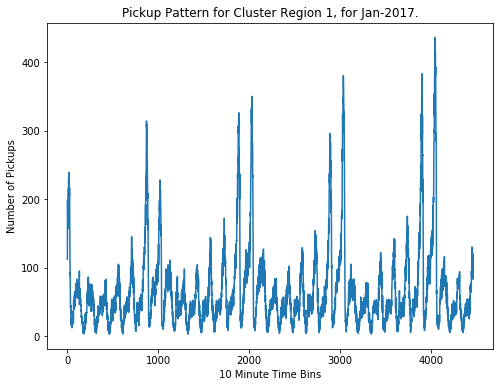

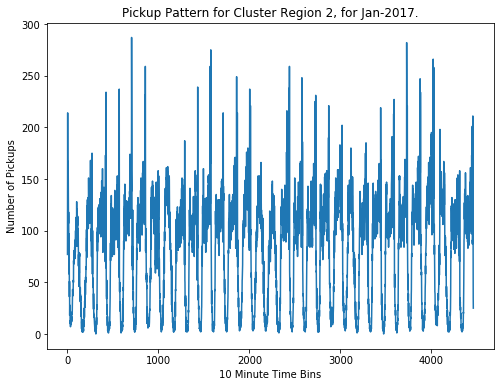

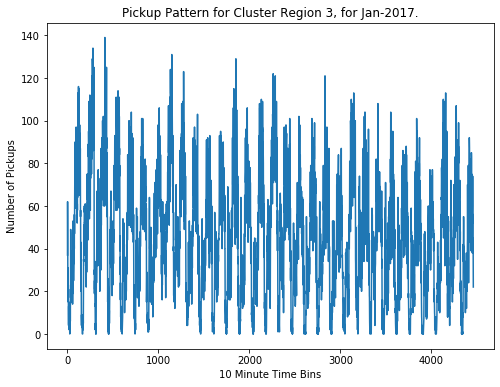

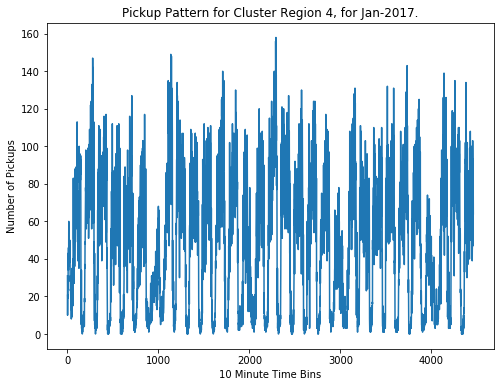

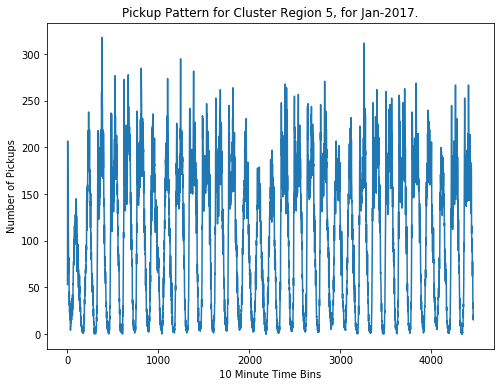

...

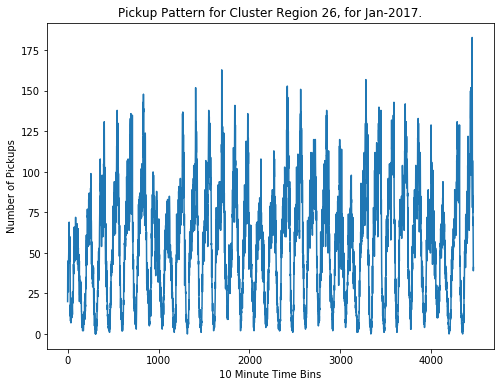

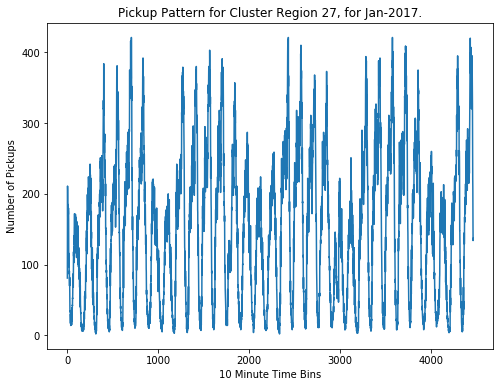

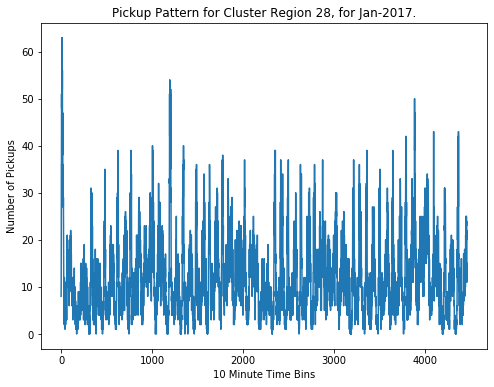

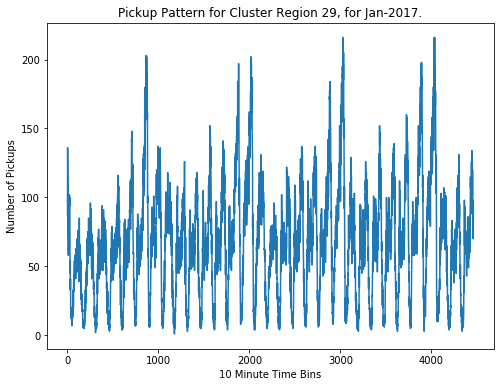

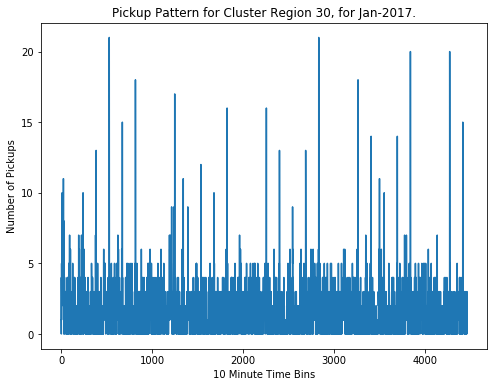

In [0]:
%matplotlib notebook
%matplotlib inline
for i in range(30):
    fig = plt.figure(figsize = (8, 6))
    plt.plot(regionWisePickup_Jan_2017[i][:4464])
    plt.title("Pickup Pattern for Cluster Region "+str(i+1)+", for Jan-2017.")
    plt.xlabel("10 Minute Time Bins")
    plt.ylabel("Number of Pickups")
plt.show()

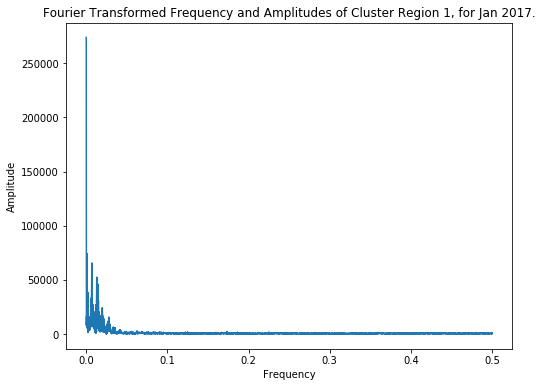

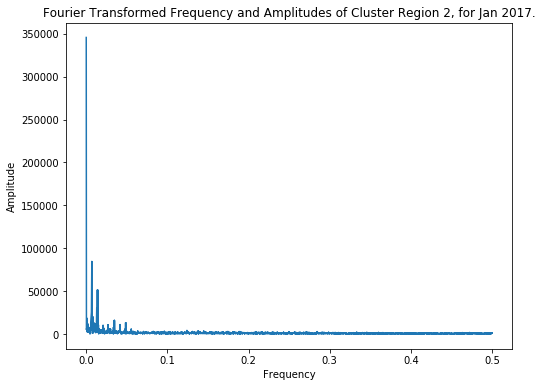

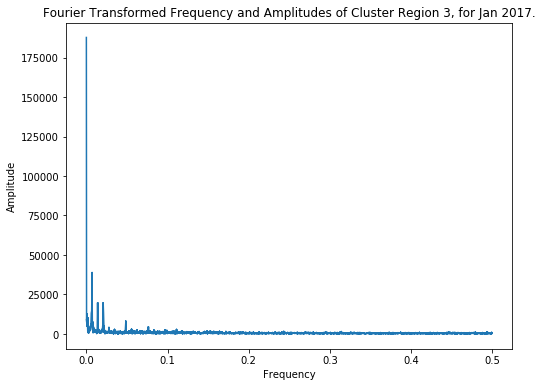

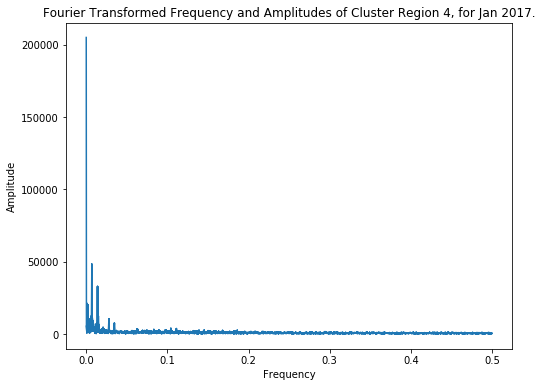

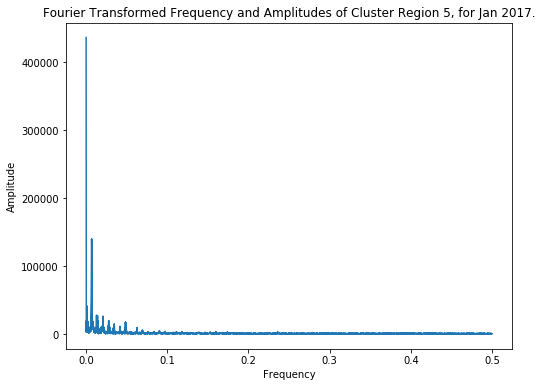

...

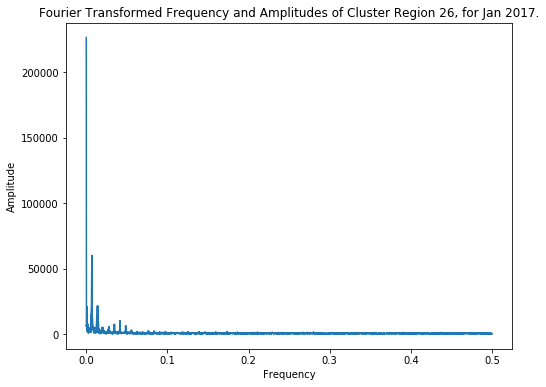

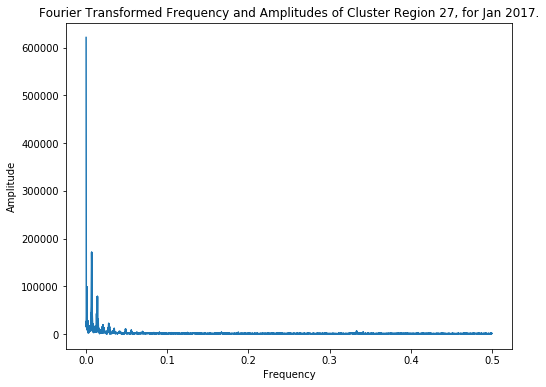

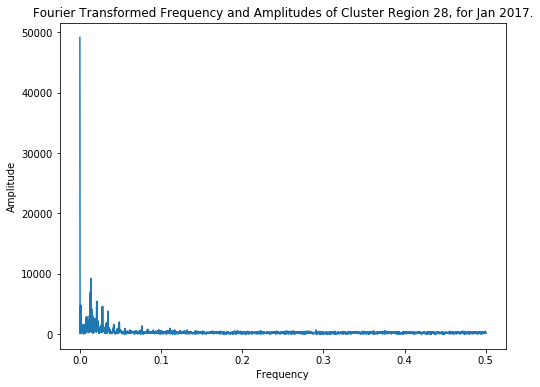

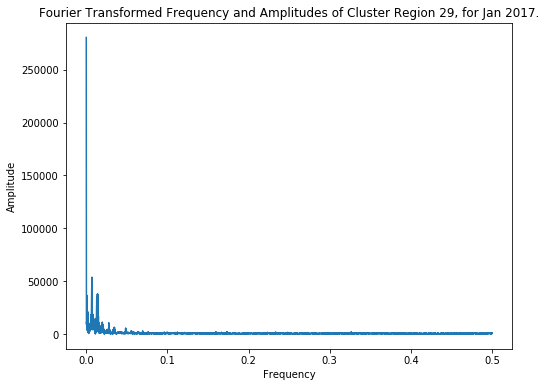

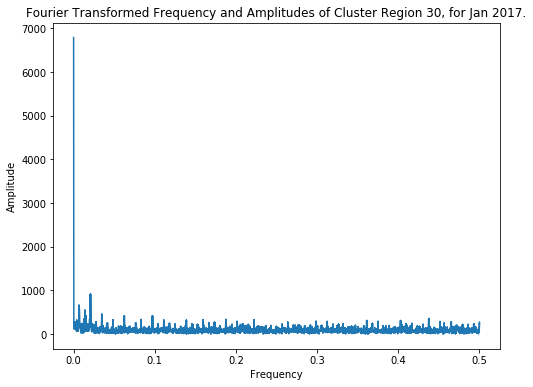

In [0]:
for i in range(30):
    Y  = np.abs(np.fft.fft(regionWisePickup_Jan_2017[i][0:4096]))
    # read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
    freq = np.abs(np.fft.fftfreq(4096, 1))
    n = len(freq)
    plt.figure(figsize = (8, 6))
    plt.plot(freq[:], Y[:])
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.title("Fourier Transformed Frequency and Amplitudes of Cluster Region "+str(i+1)+", for Jan 2017.")
    plt.show()
#Here, we are concern only about positive frequencies and ampllitudes. "np.fft.fftfreq(n, 1)" returns the frequency of sine 
#in a symmetric form, means there will be equal number of positive and negative sine wave frequencies. But we are concern only
#about positive ones.

# Preparing Models

In [0]:
number_of_time_stamps = 5
TruePickups = []
lat = []
lon = []
day_of_week = []
timeslots = []
feat = []
centerOfRegions = regions.cluster_centers_
feat = [0]*number_of_time_stamps
for i in range(30):
    lat.append([centerOfRegions[i][0]]*4459) 
    lon.append([centerOfRegions[i][1]]*4459)
    day_of_week.append([int(((int(j/144)%7)+7)%7) for j in range(5, 4464)])
    feat = np.vstack((feat, [regionWisePickup_Jan_2017[i][k:k+number_of_time_stamps] for k in range(0, len(regionWisePickup_Jan_2017[i]) - (number_of_time_stamps))]))
    TruePickups.append(regionWisePickup_Jan_2017[i][5:])
    timeslots.append([i for i in range(5, 4464)])
feat = feat[1:]

In [0]:
len(timeslots)

30

In [0]:
len(lat[0])*len(lat) == len(lon[0])*len(lon) == len(day_of_week[0])*len(day_of_week) == 4459*30 == len(feat) == len(TruePickups[0])*len(TruePickups)

True

In [0]:
feat

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       ...,
       [0, 3, 3, 0, 1],
       [3, 3, 0, 1, 1],
       [3, 0, 1, 1, 0]])

In [0]:
predicted_pickup_values = []

predicted_pickup_values_list = []

predicted_value = -1  

window_size = 5
for i in range(30):
    for j in range(4464):
        if j == 0:
            predicted_value = regionWisePickup_Jan_2017[i][j]
            predicted_pickup_values.append(0)
        else:
            if j>=window_size:
                sumPickups = 0
                sumOfWeights = 0
                for k in range(window_size, 0, -1):
                    sumPickups += k*(regionWisePickup_Jan_2017[i][j -window_size + (k - 1)])
                    sumOfWeights += k
                predicted_value = int(sumPickups/sumOfWeights)
                predicted_pickup_values.append(predicted_value)
            else:
                sumPickups = 0
                sumOfWeights = 0
                for k in range(j, 0, -1):
                    sumPickups += k*regionWisePickup_Jan_2017[i][k-1]
                    sumOfWeights += k
                predicted_value = int(sumPickups/sumOfWeights)
                predicted_pickup_values.append(predicted_value)
                
    predicted_pickup_values_list.append(predicted_pickup_values[5:])
    predicted_pickup_values = []

In [0]:
amplitude_lists = []
frequency_lists = []
for i in range(30):
    ampli  = np.abs(np.fft.fft(regionWisePickup_Jan_2017[i][0:4096]))
    freq = np.abs(np.fft.fftfreq(4096, 1))
    ampli_indices = np.argsort(-ampli)[1:]        #it will return an array of indices for which corresponding amplitude values are sorted in reverse order.
    amplitude_values = []
    frequency_values = []
    for j in range(0, 9, 2):   #taking top five amplitudes and frequencies
        amplitude_values.append(ampli[ampli_indices[j]])
        frequency_values.append(freq[ampli_indices[j]])
    for k in range(4459):    #those top 5 frequencies and amplitudes are same for all the points in one cluster
        amplitude_lists.append(amplitude_values)
        frequency_lists.append(frequency_values) 

In [0]:
train_previousFive_pickups  = [feat[i*4459:(4459*i+3567)] for i in range(30)]
test_previousFive_pickups  = [feat[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

In [0]:
train_fourier_frequencies = [frequency_lists[i*4459:(4459*i+3567)] for i in range(30)]
test_fourier_frequencies = [frequency_lists[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

In [0]:
train_fourier_amplitudes = [amplitude_lists[i*4459:(4459*i+3567)] for i in range(30)]
test_fourier_amplitudes = [amplitude_lists[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

In [0]:
len(timeslots[0])

4459

In [0]:
#taking 80% data as train data from each cluster
train_lat = [i[:3567] for i in lat]
train_lon = [i[:3567] for i in lon]
train_weekDay = [i[:3567] for i in day_of_week]
train_weighted_avg = [i[:3567] for i in predicted_pickup_values_list]
train_TruePickups = [i[:3567] for i in TruePickups]
train_timeslot = [i[:3567] for i in timeslots]

In [0]:
#taking 20% data as test data from each cluster
test_lat = [i[3567:] for i in lat]
test_lon = [i[3567:] for i in lon]
test_weekDay = [i[3567:] for i in day_of_week]
test_weighted_avg = [i[3567:] for i in predicted_pickup_values_list]
test_TruePickups = [i[3567:] for i in TruePickups]
test_timeslot = [i[3567:] for i in timeslots]

In [0]:
# convert from lists of lists of list to lists of list
train_pickups = []
test_pickups = []
train_freq = []
test_freq = []
train_amp = []
test_amp = []
# finaltimeslot = []
for i in range(30):
    train_pickups.extend(train_previousFive_pickups[i])
    test_pickups.extend(test_previousFive_pickups[i])
    train_freq.extend(train_fourier_frequencies[i])
    test_freq.extend(test_fourier_frequencies[i])
    train_amp.extend(train_fourier_amplitudes[i])
    test_amp.extend(test_fourier_amplitudes[i])
    # finaltimeslot.extend(timeslots[i])

In [0]:
train_prevPickups_freq_amp = np.hstack((train_pickups, train_freq, train_amp))
test_prevPickups_freq_amp = np.hstack((test_pickups, test_freq, test_amp))

In [0]:
train_flat_lat = sum(train_lat, [])
train_flat_lon = sum(train_lon, [])
train_flat_weekDay = sum(train_weekDay, [])
train_weighted_avg_flat = sum(train_weighted_avg, [])
train_TruePickups_flat = sum(train_TruePickups, [])
train_timeslot_flat = sum(train_timeslot, [])
test_flat_lat = sum(test_lat, [])
test_flat_lon = sum(test_lon, [])
test_flat_weekDay = sum(test_weekDay, [])
test_weighted_avg_flat = sum(test_weighted_avg, [])
test_TruePickups_flat = sum(test_TruePickups, [])
test_timeslot_flat = sum(test_timeslot,[])

In [0]:
#train dataframe
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1', 'freq1', 'freq2','freq3','freq4','freq5', 'Amp1', 'Amp2', 'Amp3', 'Amp4', 'Amp5']
Train_DF = pd.DataFrame(data = train_prevPickups_freq_amp, columns = columns)
Train_DF["Latitude"] = train_flat_lat
Train_DF["Longitude"] = train_flat_lon
Train_DF["WeekDay"] = train_flat_weekDay
Train_DF["WeightedAvg"] = train_weighted_avg_flat
Train_DF["TimeSlot"] = train_timeslot_flat

In [0]:
#test dataframe
Test_DF = pd.DataFrame(data = test_prevPickups_freq_amp, columns = columns)
Test_DF["Latitude"] = test_flat_lat
Test_DF["Longitude"] = test_flat_lon
Test_DF["WeekDay"] = test_flat_weekDay
Test_DF["WeightedAvg"] = test_weighted_avg_flat
Test_DF["TimeSlot"] = test_timeslot_flat

In [0]:
print("Shape of train data = "+str(Train_DF.shape))
print("Shape of test data = "+str(Test_DF.shape))

Shape of train data = (107010, 20)
Shape of test data = (26760, 20)


In [0]:
Train_DF.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,freq1,freq2,freq3,freq4,freq5,Amp1,Amp2,Amp3,Amp4,Amp5,Latitude,Longitude,WeekDay,WeightedAvg,TimeSlot
0,25.0,65.0,80.0,83.0,81.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,0,75,5
1,65.0,80.0,83.0,81.0,81.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,0,80,6
2,80.0,83.0,81.0,81.0,105.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,0,89,7
3,83.0,81.0,81.0,105.0,84.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,0,88,8
4,81.0,81.0,105.0,84.0,82.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,0,86,9


In [0]:
train_TruePickups_flat[:5]

[158, 204, 182, 159, 152]

In [0]:
Test_DF.tail()

,ft_5,ft_4,ft_3,ft_2,ft_1,freq1,freq2,freq3,freq4,freq5,Amp1,Amp2,Amp3,Amp4,Amp5,Latitude,Longitude,WeekDay,WeightedAvg,TimeSlot
26755,8.0,9.0,9.0,9.0,6.0,0.000977,0.006836,0.00708,0.001953,0.020996,6574.602012,5465.111088,3503.96562,3064.560867,2948.590711,40.761359,-73.921133,2,7,4459
26756,9.0,9.0,9.0,6.0,7.0,0.000977,0.006836,0.00708,0.001953,0.020996,6574.602012,5465.111088,3503.96562,3064.560867,2948.590711,40.761359,-73.921133,2,7,4460
26757,9.0,9.0,6.0,7.0,12.0,0.000977,0.006836,0.00708,0.001953,0.020996,6574.602012,5465.111088,3503.96562,3064.560867,2948.590711,40.761359,-73.921133,2,8,4461
26758,9.0,6.0,7.0,12.0,7.0,0.000977,0.006836,0.00708,0.001953,0.020996,6574.602012,5465.111088,3503.96562,3064.560867,2948.590711,40.761359,-73.921133,2,8,4462
26759,6.0,7.0,12.0,7.0,5.0,0.000977,0.006836,0.00708,0.001953,0.020996,6574.602012,5465.111088,3503.96562,3064.560867,2948.590711,40.761359,-73.921133,2,7,4463


# Training Neural Networks using pytorch

In [0]:
import torch

In [0]:
import math

def roundup(x):
    return int(math.ceil(x / 50.0)) * 50

In [0]:
train_TruePickups_flat[:5]

[216, 204, 213, 249, 236]

In [0]:
train_label[:5]

[250, 250, 250, 200, 200]

In [0]:
Train_DF["train_TruePickups_flat"] = train_TruePickups_flat

In [0]:
Train_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Train_DF.csv') 

In [0]:
Test_DF["test_TruePickups_flat"] = test_TruePickups_flat

In [0]:
Test_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Test_DF.csv') 

In [0]:
train_label = [i - (i%50) if i%50>25 else i+(50-i%50) for i in train_TruePickups_flat]

In [0]:
test_label = [i - (i%50) if i%50>25 else i+(50-i%50) for i in test_TruePickups_flat]

In [0]:
labelDic = torch.Tensor(np.unique(train_label)).type(torch.cuda.FloatTensor)

In [0]:
num_classes = len(np.unique(train_label))

In [0]:
train_dataset = torch.tensor(Train_DF.values.astype(np.float32)).cuda()
test_dataset = torch.tensor(Test_DF.values.astype(np.float32)).cuda()
train_labels = torch.tensor(train_label).cuda()
test_labels = torch.tensor(test_label).cuda()

In [0]:
train_dataset.shape

torch.Size([107010, 19])

In [0]:
train_labels.shape

torch.Size([107010])

In [0]:
import torch.utils.data as data
class CustomDataloader(data.Dataset):
    def __init__(self, data, labels):
        self.data, self.labels =  data, labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx].type(torch.cuda.FloatTensor), self.labels[idx].type(torch.cuda.LongTensor)
         


In [0]:
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim
from torch.autograd import Function
import torch.nn as nn
import torch.optim as optim

In [0]:
trainDataLoader =  DataLoader(CustomDataloader(train_dataset, train_labels), shuffle=True, batch_size=10)

In [0]:
testDataLoader =  DataLoader(CustomDataloader(test_dataset, test_labels), shuffle=True, batch_size=10)

In [0]:
num_epochs = 50

In [0]:
num_classes

13

In [0]:
class NeuralNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(20, 200)
        self.fc2 = nn.Linear(200, 200)
        self.fc3 = nn.Linear(200, num_classes)

    def forward(self, x):
        x1 = self.fc1(x)
        x2 = self.fc2(x1)
        x3 = self.fc3(x2)
        x4 = F.relu(x3)
        return x4

In [0]:
learning_rate =100
network = NeuralNet().cuda()
optimizer = torch.optim.SGD(network.parameters(),lr = learning_rate)
lossFunction = nn.MSELoss()

In [0]:
network.train()

for epoch in range(num_epochs):
  print("Epoch {}/{}".format(epoch, num_epochs - 1))
  running_loss = 0.0
  running_corrects = 0
  for inputs, labels in trainDataLoader:
    # inputs = inputs.cuda()
    labels = labels.squeeze()
    optimizer.zero_grad()
    # print("here")
    # print(inputs.shape)
    outputs = network(inputs)
    _, preds = torch.max(outputs, 1)
    print(preds)
    # print(outputs.shape)
    print(outputs)
    # print(preds)
    # labels = labels.type(torch.cuda.FloatTensor)
    # labelsFinal = torch.tensor(labelDic[preds], requires_grad=True)    
    # print(labels.squeeze())
    # print(labelsFinal)
    loss = lossFunction(outputs, labels)
    loss.backward()
    optimizer.step()
    running_loss += loss.item() * inputs.size(0)
    running_corrects += torch.sum(preds == labels.data)
    # break
  epoch_loss = running_loss / len(trainDataLoader.dataset)
  epoch_acc = running_corrects.double() / len(trainDataLoader.dataset)

  print(f"Loss is {epoch_loss}")



# SKLearn Model

In [0]:
Train_DF = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/Train_DF_Yellow_Cab.csv')

In [0]:
Test_DF = pd.read_csv(r'/content/drive/My Drive/NYTaxiData/Test_DF_Yellow_Cab.csv')

In [0]:
Train_DF['train_TruePickups_flat'] = train_TruePickups_flat
Test_DF['test_TruePickups_flat'] = test_TruePickups_flat

In [0]:
Test_DF.columns


Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'freq1', 'freq2', 'freq3',
       'freq4', 'freq5', 'Amp1', 'Amp2', 'Amp3', 'Amp4', 'Amp5', 'Latitude',
       'Longitude', 'WeekDay', 'WeightedAvg', 'TimeSlot',
       'test_TruePickups_flat'],
      dtype='object')

In [0]:
train_TruePickups_flat = Train_DF['train_TruePickups_flat']
test_TruePickups_flat = Test_DF['test_TruePickups_flat']
Train_DF = Train_DF[['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1',
       'freq1', 'freq2', 'freq3', 'freq4', 'freq5', 'Amp1', 'Amp2', 'Amp3',
       'Amp4', 'Amp5', 'Latitude', 'Longitude', 'WeekDay', 'WeightedAvg',
       'TimeSlot', 'AWND', 'EMNT', 'EMSD', 'EMSN',
       'EMXP', 'EMXT', 'HDSD', 'PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN', 'TSUN']]
Test_DF = Test_DF[['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1',
       'freq1', 'freq2', 'freq3', 'freq4', 'freq5', 'Amp1', 'Amp2', 'Amp3',
       'Amp4', 'Amp5', 'Latitude', 'Longitude', 'WeekDay', 'WeightedAvg',
       'TimeSlot', 'AWND', 'EMNT', 'EMSD', 'EMSN',
       'EMXP', 'EMXT', 'HDSD', 'PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN', 'TSUN']]

In [0]:
def getnearestweather(df):
  header_list = df.columns.tolist() + ['AWND', 'EMNT', 'EMSD', 'EMSN', 'EMXP', 'EMXT',
       'HDSD', 'PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN', 'TSUN']
  df = df.reindex(header_list, axis = 1)

  for index, row in df.iterrows():
    min_distance = 100000000
    minindex = -1
    for index1, weatherrow in weather.iterrows():
      distance = gpxpy.geo.haversine_distance(latitude_1 = row['Latitude'], 
                                              longitude_1 = row['Longitude'], 
                                              latitude_2 = weatherrow['LATITUDE'], 
                                              longitude_2 = weatherrow['LONGITUDE'])      
      distance = distance/(1.60934*1000)   #distance from meters to miles
      min_distance = min(min_distance, distance)
      if(min_distance == distance):
        minindex = index1
    df.loc[index, 'AWND']=weather.iloc[minindex]['AWND'] 
    df.loc[index, 'EMNT']=weather.iloc[minindex]['EMNT']
    df.loc[index, 'EMSD']=weather.iloc[minindex]['EMSD']
    df.loc[index, 'EMSN']=weather.iloc[minindex]['EMSN']
    df.loc[index, 'EMXP']=weather.iloc[minindex]['EMXP']
    df.loc[index, 'EMXT']=weather.iloc[minindex]['EMXT']
    df.loc[index, 'HDSD']=weather.iloc[minindex]['HDSD']
    df.loc[index, 'PRCP']=weather.iloc[minindex]['PRCP']
    df.loc[index, 'SNOW']=weather.iloc[minindex]['SNOW']   
    df.loc[index, 'TAVG']=weather.iloc[minindex]['TAVG']
    df.loc[index, 'TMAX']=weather.iloc[minindex]['TMAX']
    df.loc[index, 'TMIN']=weather.iloc[minindex]['TMIN']
    df.loc[index, 'TSUN']=weather.iloc[minindex]['TSUN']   
  return df

Test_DF = getnearestweather(Test_DF)
      
    
Train_DF = getnearestweather(Train_DF)

In [0]:
Test_DF.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,freq1,freq2,freq3,freq4,freq5,Amp1,Amp2,Amp3,Amp4,Amp5,Latitude,Longitude,WeekDay,WeightedAvg,TimeSlot,test_TruePickups_flat,AWND,EMNT,EMSD,EMSN,EMXP,EMXT,HDSD,PRCP,SNOW,TAVG,TMAX,TMIN,TSUN
0,106.0,120.0,111.0,130.0,110.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,3,116,3572,121,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,0.0,0.0,0.0,0.0
1,120.0,111.0,130.0,110.0,121.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,3,118,3573,127,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,0.0,0.0,0.0,0.0
2,111.0,130.0,110.0,121.0,127.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,3,121,3574,123,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,0.0,0.0,0.0,0.0
3,130.0,110.0,121.0,127.0,123.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,3,122,3575,121,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,0.0,0.0,0.0,0.0
4,110.0,121.0,127.0,123.0,121.0,0.006836,0.00708,0.013916,0.000977,0.012939,57993.999619,39306.854755,30310.462641,23583.067229,22308.414511,40.708169,-74.011799,3,122,3576,114,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,0.0,0.0,0.0,0.0,0.0


In [0]:
Train_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Train_DF_Yellow_Cab.csv')
# Train_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Train_DF_Green_Cab.csv')

In [0]:
Test_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Test_DF_Yellow_Cab.csv')
# Test_DF.to_csv(r'/content/drive/My Drive/NYTaxiData/Test_DF_Green_Cab.csv')

In [0]:
def mlp(train_data, train_true, test_data, test_true):
    #standardizing the data
  train_std = StandardScaler().fit_transform(train_data)
  test_std = StandardScaler().fit_transform(test_data)
  
  #hyper-paramater tuning  
  clf = MLPClassifier(solver='adam', alpha=.1,
                     hidden_layer_sizes=(150, 150), random_state=500, learning_rate = 'constant')
  clf.fit(train_std, train_true)
  train_pred = clf.predict(train_std)
  train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
  train_MSE = mean_squared_error(train_true, train_pred)
  test_pred = clf.predict(test_std)
  test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
  test_MSE = mean_squared_error(test_true, test_pred)
    
  return train_MAPE, train_MSE, test_MAPE, test_MSE
def lin_regression(train_data, train_true, test_data, test_true):
    
    #standardizing the data
    train_std = StandardScaler().fit_transform(train_data)
    test_std = StandardScaler().fit_transform(test_data)
    
    #hyper-paramater tuning
    clf = SGDRegressor(loss = "squared_loss", penalty = "l2")
    values = [10**-14, 10**-12, 10**-10, 10**-8, 10**-6, 10**-4, 10**-2, 10**0, 10**2, 10**4, 10**6]
    hyper_parameter = {"alpha": values}
    best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_std, train_true)
    alpha = best_parameter.best_params_["alpha"]
    
    #applying linear regression with best hyper-parameter
    clf = SGDRegressor(loss = "squared_loss", penalty = "l2", alpha = alpha)
    clf.fit(train_std, train_true)
    train_pred = clf.predict(train_std)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_std)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE
def randomFor(train_data, train_true, test_data, test_true):
    
    #hyper-paramater tuning
    values = [10, 40, 80, 150, 600, 800]
    clf = RandomForestRegressor(n_jobs = -1)
    hyper_parameter = {"n_estimators": values}
    best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_data, train_true)
    estimators = best_parameter.best_params_["n_estimators"]
    
    #applying random forest with best hyper-parameter
    clf = RandomForestRegressor(n_estimators = estimators, n_jobs = -1)
    clf.fit(train_data, train_true)
    train_pred = clf.predict(train_data)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_data)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE
def xgboost_reg(train_data, train_true, test_data, test_true):
    #hyper-parameter tuning
    hyper_parameter = {"max_depth":[1, 2, 3, 4], "n_estimators":[40, 80, 150, 600]}
    clf = xgb.XGBRegressor()
    best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_data, train_true)
    estimators = best_parameter.best_params_["n_estimators"]
    depth = best_parameter.best_params_["max_depth"]
    
    #applying xgboost regressor with best hyper-parameter
    clf = xgb.XGBRegressor(max_depth = depth, n_estimators = estimators)
    clf.fit(train_data, train_true)
    train_pred = clf.predict(train_data)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_data)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE

In [0]:
trainMAPE_lr, trainMSE_lr, testMAPE_lr, testMSE_lr = lin_regression(Train_DF, train_TruePickups_flat, Test_DF, test_TruePickups_flat)
trainMAPE_rf, trainMSE_rf, testMAPE_rf, testMSE_rf = randomFor(Train_DF, train_TruePickups_flat, Test_DF, test_TruePickups_flat)
trainMAPE_xgb, trainMSE_xgb, testMAPE_xgb, testMSE_xgb = xgboost_reg(Train_DF, train_TruePickups_flat, Test_DF, test_TruePickups_flat)
trainMAPE_mlp, trainMSE_mlp, testMAPE_mlp, testMSE_mlp = mlp(Train_DF, train_TruePickups_flat, Test_DF, test_TruePickups_flat)
# trainMAPE_lr, trainMSE_lr, testMAPE_lr, testMSE_lr = lin_regression(Train_DF, train_label, Test_DF, test_label)
# trainMAPE_rf, trainMSE_rf, testMAPE_rf, testMSE_rf = randomFor(Train_DF, train_label, Test_DF, test_label)
# trainMAPE_xgb, trainMSE_xgb, testMAPE_xgb, testMSE_xgb = xgboost_reg(Train_DF, train_label, Test_DF, test_label)

[08:48:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:48:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [0]:
error_table_regressions = pd.DataFrame(columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"])

error_table_regressions = error_table_regressions.append(pd.DataFrame([["Linear Regression", trainMAPE_lr*100, trainMSE_lr, testMAPE_lr*100, testMSE_lr ]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions = error_table_regressions.append(pd.DataFrame([["Random Forest Regression", trainMAPE_rf*100, trainMSE_rf, testMAPE_rf*100, testMSE_rf]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions = error_table_regressions.append(pd.DataFrame([["XGBoost Regressor", trainMAPE_xgb*100, trainMSE_xgb, testMAPE_xgb*100, testMSE_xgb]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions = error_table_regressions.append(pd.DataFrame([["MLP", trainMAPE_mlp*100, trainMSE_mlp, testMAPE_mlp*100, testMSE_mlp]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
# error_table_regressions.reset_index(drop = True, inplace = True)

In [0]:
error_table_regressions

,Model,TrainMAPE(%),TrainMSE,TestMAPE(%),TestMSE
0,Linear Regression,33.774125,8.294483,32.578688,9.379364
0,Random Forest Regression,12.569301,1.142423,37.664249,10.659669
0,XGBoost Regressor,31.495877,6.901285,37.077264,10.525930
0,MLP,33.819814,8.956077,33.741095,10.658240


In [0]:
error_table_regressions

,Model,TrainMAPE(%),TrainMSE,TestMAPE(%),TestMSE
0,Linear Regression,13.355924,185.022980,14.397238,272.951709
0,Random Forest Regression,4.753929,23.701961,13.096294,202.902015
0,XGBoost Regressor,11.713362,137.883731,14.536970,242.794858
0,MLP,13.563219,198.176385,15.137497,296.043386
